## Document Forgery Detection: Machine Learning Classification Report

### Overview

This notebook trains and evaluates a Random Forest model for forged-document detection using features produced by `dataset_builder.py / feature_engineering.py`.
The report emphasizes stakeholder-ready evidence for banking use cases:
- **Accuracy and class-level quality** (precision, recall, F1-score)
- **Confusion matrix** on on both hold-out and generated train/validation/testing data
- **Risk-oriented metrics** like false positive/negative rates
- **Model explainability** via top forensic indicators


In [1]:
import json
import os
from pathlib import Path
import joblib
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import time
import shap
import pickle
import torch
import torch.nn as nn
import torch.optim as optim
import cv2
import warnings
warnings.filterwarnings("ignore")

from feature_engineering import DocumentForgeryDetector
from feature_engineering import COUNTRY_REQUIRED_FIELDS
from sklearn.compose import ColumnTransformer
from sklearn.dummy import DummyClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.utils import resample
from sklearn import metrics
from sklearn.metrics import (
    classification_report,
    accuracy_score,
    recall_score,
    precision_score,
    f1_score,
    balanced_accuracy_score,
    confusion_matrix,
    matthews_corrcoef,
    precision_recall_fscore_support,
    roc_auc_score,
    roc_curve,
)
from sklearn.model_selection import StratifiedKFold, cross_validate
from sklearn.svm import SVC
from xgboost import XGBClassifier
from scipy.optimize import brentq
from scipy.interpolate import interp1d
from copy import deepcopy
from PIL import Image
from torchvision import models, transforms
from torch.utils.data import Dataset, DataLoader


c:\Users\user\OneDrive - mmu.edu.my\Desktop\FYP\code\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Load datasets generated from `training_set` / `validation_set` / `testing_set`
TRAIN_DATASET_PATH = "dataset_outputs/train.csv"
VALIDATION_DATASET_PATH = "dataset_outputs/val.csv"
TEST_DATASET_PATH = "dataset_outputs/test.csv"

if not Path(TRAIN_DATASET_PATH).exists():
    raise FileNotFoundError(f"Missing required dataset: {TRAIN_DATASET_PATH}")

assert Path(VALIDATION_DATASET_PATH).exists(), "Validation dataset is required."
assert Path(TEST_DATASET_PATH).exists(), "Test dataset is required."

df_train_raw = pd.read_csv(TRAIN_DATASET_PATH)
df_validation = pd.read_csv(VALIDATION_DATASET_PATH)
df_test = pd.read_csv(TEST_DATASET_PATH)

print("Training dataset shape:", df_train_raw.shape)
print("Validation dataset shape:", df_validation.shape)
print("Test dataset shape:", df_test.shape)

display(df_train_raw.head())

print("Training label distribution:")
print(df_train_raw["Label"].value_counts())
assert df_train_raw["Label"].nunique() == 2, (
    "Dataset contains only one class; forgery detection requires genuine + forged examples."
)

print("Validation label distribution:")
print(df_validation["Label"].value_counts())

print("Test label distribution:")
print(df_test["Label"].value_counts())


Training dataset shape: (315, 35)
Validation dataset shape: (69, 35)
Test dataset shape: (66, 35)


,Char_Count,Field_Detected_Count,Field_Completeness_Ratio,H_Mean,H_STD,W_Mean,W_STD,AR_Mean,AR_STD,Ink_Mean,...,Field_Count,Has_POB,Num_Anomalies,Num_Background_Anomalies,Num_OCR_Box_Anomalies,OCR_Quality,Field_Completeness,Image_Name,Country_Code,Label
0,2214,0,0.0,11.981481,14.184139,9.682927,15.436899,0.847761,0.580053,197.517698,...,0,0,2146,0,0,0.0,0.0,alb_id_00.jpg,ALB,0
1,2092,0,0.0,12.142447,14.715946,10.136711,15.967565,0.874086,0.600505,197.122105,...,0,0,2027,0,0,0.0,0.0,alb_id_00_fake_6_25.jpg,ALB,1
2,2242,0,0.0,12.217663,14.561871,9.845674,15.849884,0.841977,0.575563,197.042435,...,0,0,2166,0,0,0.0,0.0,alb_id_01.jpg,ALB,0
3,2214,0,0.0,12.304426,14.457501,10.041102,15.333970,0.858098,0.576714,197.230723,...,0,0,2132,0,0,0.0,0.0,alb_id_01_fake_6_56.jpg,ALB,1
4,2282,0,0.0,12.113059,13.589526,9.783085,14.073639,0.850109,0.575822,196.952310,...,0,0,2211,0,0,0.0,0.0,alb_id_01_fake_6_61.jpg,ALB,1


Training label distribution:
Label
1    168
0    147
Name: count, dtype: int64
Validation label distribution:
Label
0    35
1    34
Name: count, dtype: int64
Test label distribution:
Label
1    39
0    27
Name: count, dtype: int64


In [3]:
# Split Features & Labels

# Training set
X_train = df_train_raw.drop(columns=["Label"])
y_train = df_train_raw["Label"]

# Validation set
assert df_validation is not None, "Validation dataset is required"
X_val = df_validation.drop(columns=["Label"])
y_val = df_validation["Label"]

# Test set
assert df_test is not None, "Test dataset is required"
X_test = df_test.drop(columns=["Label"])
y_test = df_test["Label"]

print("Dataset Shapes:")
print("Train:", X_train.shape)
print("Validation:", X_val.shape)
print("Test:", X_test.shape)


Dataset Shapes:
Train: (315, 34)
Validation: (69, 34)
Test: (66, 34)


In [4]:
# Feature / Target prep + leakage cleanup 
LEAKAGE_COLUMNS = ["Document_ID", "Image_Name"]

def drop_leakage_columns(df):
    leakage_prefixes = ("Image_Name_", "Country_Code_", "Country_Name_")
    drop_cols = [
        col for col in df.columns
        if col in LEAKAGE_COLUMNS or any(col.startswith(prefix) for prefix in leakage_prefixes)
    ]
    if drop_cols:
        print("[WARN] Dropping leakage/pre-encoded columns:", sorted(drop_cols))
    return df.drop(columns=drop_cols, errors="ignore")

X_train = drop_leakage_columns(X_train)
X_val = drop_leakage_columns(X_val)
X_test = drop_leakage_columns(X_test)

y_train = y_train.astype(int)
y_val = y_val.astype(int)
y_test = y_test.astype(int)

categorical_features = [c for c in ["Country_Code", "Country_Name"] if c in X_train.columns]
numerical_features = [c for c in X_train.columns if c not in categorical_features]

print("Categorical features:", categorical_features)
print("Numerical feature count:", len(numerical_features))
print("Final train feature count:", X_train.shape[1])


[WARN] Dropping leakage/pre-encoded columns: ['Image_Name']
[WARN] Dropping leakage/pre-encoded columns: ['Image_Name']
[WARN] Dropping leakage/pre-encoded columns: ['Image_Name']
Categorical features: ['Country_Code']
Numerical feature count: 32
Final train feature count: 33


### Train/Test Split (70:30 Ratio)

In [5]:
# Dataset split summary (predefined train/validation/test files)
print("Training samples:", len(X_train))
print("Validation samples:", len(X_val))
print("Testing samples:", len(X_test))


Training samples: 315
Validation samples: 69
Testing samples: 66


In [6]:
# DATASET DISTRIBUTION ANALYSIS

# Load datasets
train_df = pd.read_csv(
    "dataset_outputs/train.csv"
)
test_df = pd.read_csv(
    "dataset_outputs/test.csv"
)

# Optional validation set
try:
    val_df = pd.read_csv(
        "dataset_outputs/val.csv"
    )
except:
    val_df = None

# CLASS DISTRIBUTION
train_authentic = (
    train_df["Label"] == 0
).sum()

train_forged = (
    train_df["Label"] == 1
).sum()

test_authentic = (
    test_df["Label"] == 0
).sum()

test_forged = (
    test_df["Label"] == 1
).sum()

# Validation Set (Optional)
if val_df is not None:
    val_authentic = (
        val_df["Label"] == 0
    ).sum()

    val_forged = (
        val_df["Label"] == 1
    ).sum()

    validation_count = len(val_df)

else:
    val_authentic = 0
    val_forged = 0
    validation_count = 0

# Total Counts
total_authentic = (
    train_authentic
    + test_authentic
    + val_authentic
)

total_forged = (
    train_forged
    + test_forged
    + val_forged
)

total_documents = (
    total_authentic
    + total_forged
)

# SUMMARY TABLE
dataset_summary = pd.DataFrame({
    "Dataset Component": [
        "Authentic Documents",
        "Forged Documents",
        "Total Documents",
        "Training Samples",
        "Validation Samples",
        "Testing Samples"
    ],

    "Count": [
        total_authentic,
        total_forged,
        total_documents,
        len(train_df),
        validation_count,
        len(test_df)
    ]
})

# Display summary
print("\nDataset Summary\n")
print(dataset_summary)

# CLASS DISTRIBUTION TABLE
distribution_df = pd.DataFrame({
    "Subset": [
        "Training",
        "Validation",
        "Testing"
    ],

    "Authentic": [
        train_authentic,
        val_authentic,
        test_authentic
    ],

    "Forged": [
        train_forged,
        val_forged,
        test_forged
    ]
})

print("\nClass Distribution\n")
print(distribution_df)


Dataset Summary

     Dataset Component  Count
0  Authentic Documents    209
1     Forged Documents    241
2      Total Documents    450
3     Training Samples    315
4   Validation Samples     69
5      Testing Samples     66

Class Distribution

       Subset  Authentic  Forged
0    Training        147     168
1  Validation         35      34
2     Testing         27      39


### Baseline Model (Majority Class Predictor)


In [7]:
# Baseline model: predicts most frequent class
baseline_model = DummyClassifier(strategy="most_frequent")

# Fit ONLY on training labels (no real learning)
baseline_model.fit(X_train, y_train)

print("[INFO] Baseline model (Majority Class) initialized.")


[INFO] Baseline model (Majority Class) initialized.


In [8]:
# BASELINE - VALIDATION PERFORMANCE
val_pred_baseline = baseline_model.predict(X_val)
val_acc_baseline = accuracy_score(y_val, val_pred_baseline)

print("\n[BASELINE VALIDATION RESULTS]")
print(f"Accuracy: {val_acc_baseline:.4f}")
print("\nClassification Report:")
print(classification_report(y_val, val_pred_baseline))



[BASELINE VALIDATION RESULTS]
Accuracy: 0.4928

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        35
           1       0.49      1.00      0.66        34

    accuracy                           0.49        69
   macro avg       0.25      0.50      0.33        69
weighted avg       0.24      0.49      0.33        69



In [9]:
# BASELINE - TEST PERFORMANCE

test_pred_baseline = baseline_model.predict(X_test)
test_acc_baseline = accuracy_score(y_test, test_pred_baseline)

print("\n[BASELINE TEST RESULTS]")
print(f"Accuracy: {test_acc_baseline:.4f}")
print("\nClassification Report:")
print(classification_report(y_test, test_pred_baseline))



[BASELINE TEST RESULTS]
Accuracy: 0.5909

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        27
           1       0.59      1.00      0.74        39

    accuracy                           0.59        66
   macro avg       0.30      0.50      0.37        66
weighted avg       0.35      0.59      0.44        66



### Random Forest Classifier Training

In [10]:
# Train Full Pipeline (Preprocessing + RandomForest)

preprocessor = ColumnTransformer(
    transformers=[
        (
            "cat",
            Pipeline([
                ("imputer", SimpleImputer(strategy="most_frequent")),
                ("onehot", OneHotEncoder(handle_unknown="ignore")),
            ]),
            categorical_features,
        ),
        (
            "num",
            Pipeline([
                ("imputer", SimpleImputer(strategy="median")),
            ]),
            numerical_features,
        ),
    ],
    remainder="drop",
)

rf_pipeline = Pipeline([
    ("preprocessor", preprocessor),
    (
        "classifier",
        RandomForestClassifier(
            n_estimators=50,
            random_state=42,
            class_weight="balanced",
        ),
    ),
])

rf_pipeline.fit(X_train, y_train)

print("[INFO] Full sklearn pipeline trained (preprocessing + classifier).")


[INFO] Full sklearn pipeline trained (preprocessing + classifier).


In [11]:
# Validation Evaluation
def evaluate_classifier(rf_pipeline, X_eval, y_eval, dataset_name="Dataset"):
    preds = rf_pipeline.predict(X_eval)
    probs = rf_pipeline.predict_proba(X_eval)[:, 1] if hasattr(rf_pipeline, "predict_proba") else None

    precision, recall, f1, _ = precision_recall_fscore_support(
       y_eval,
       preds,
       average='binary',
       zero_division=0,
       )

    metrics = {
        "dataset": dataset_name,
        "accuracy": float(accuracy_score(y_eval, preds)),
        "balanced_accuracy": float(balanced_accuracy_score(y_eval, preds)),
        "precision" : float(precision),
        "recall": float(recall),
        "f1_score": float(f1),
        "mcc": float(matthews_corrcoef(y_eval, preds)),
        "roc_auc": float(roc_auc_score(y_eval, probs)) if probs is not None else None,
        "classification_report" : classification_report(
            y_eval,
            preds,
            target_names=["Genuine", "Forged"],
            output_dict=True,
            zero_division=0,
            )
     }

    tn, fp, fn, tp = confusion_matrix(y_eval, preds).ravel()
    metrics.update(
        {
            "tn": int(tn),
            "fp": int(fp),
            "fn": int(fn),
            "tp": int(tp),
            "false_positive_rate": float(fp / (fp + tn)) if (fp + tn) > 0 else 0.0,
            "false_negative_rate": float(fn / (fn + tp)) if (fn + tp) > 0 else 0.0,
        }
    )

    print(f"=== RANDOM FOREST RESULTS ({dataset_name}) ===")
    print(f"Accuracy:           {metrics['accuracy']:.4f}")
    print(f"Balanced Accuracy:  {metrics['balanced_accuracy']:.4f}")
    print(f"Precision:          {metrics['precision']:.4f}")
    print(f"Recall:             {metrics['recall']:.4f}")
    print(f"F1-Score:           {metrics['f1_score']:.4f}")
    print(f"MCC:                {metrics['mcc']:.4f}")
    if metrics["roc_auc"] is not None:
        print(f"ROC AUC:        {metrics['roc_auc']:.4f}")
    print(f"FPR / FNR:         {metrics['false_positive_rate']:.4f} / {metrics['false_negative_rate']:.4f}")
    print(f"Confusion Matrix: TN={tn}, FP={fp}, FN={fn}, TP={tp}")
    print(classification_report(y_eval, preds, target_names=["Genuine", "Forged"], zero_division=0))

    return preds, metrics

val_pred = rf_pipeline.predict(X_val)
val_acc = accuracy_score(y_val, val_pred)

_, validation_metrics = evaluate_classifier(rf_pipeline, X_val, y_val, dataset_name="Validation Set")


=== RANDOM FOREST RESULTS (Validation Set) ===
Accuracy:           0.8261
Balanced Accuracy:  0.8261
Precision:          0.8235
Recall:             0.8235
F1-Score:           0.8235
MCC:                0.6521
ROC AUC:        0.8966
FPR / FNR:         0.1714 / 0.1765
Confusion Matrix: TN=29, FP=6, FN=6, TP=28
              precision    recall  f1-score   support

     Genuine       0.83      0.83      0.83        35
      Forged       0.82      0.82      0.82        34

    accuracy                           0.83        69
   macro avg       0.83      0.83      0.83        69
weighted avg       0.83      0.83      0.83        69



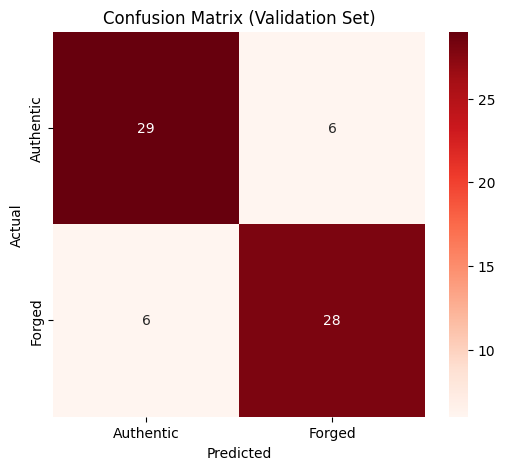

In [12]:
cm = confusion_matrix(y_val, val_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Reds",
            xticklabels=["Authentic", "Forged"],
            yticklabels=["Authentic", "Forged"])

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix (Validation Set)")
plt.show()


#### Save the Trained Model

This avoids having to retrain the model every time you want to make a prediction.

In [13]:
MODEL_DIR = "trained_models"
os.makedirs(MODEL_DIR, exist_ok=True)

model_path = os.path.join(MODEL_DIR, "forged_document_rf_model.pkl")
joblib.dump(rf_pipeline, model_path)
print(f"Trained model saved to: {model_path}")


Trained model saved to: trained_models\forged_document_rf_model.pkl


In [14]:
metrics_path = os.path.join(MODEL_DIR, "training_metrics.json")
with open(metrics_path, "w", encoding="utf-8") as f:
    json.dump({"validation_set": validation_metrics}, f, indent=2)
print(f"Validation metrics saved to: {metrics_path}")


Validation metrics saved to: trained_models\training_metrics.json


In [15]:

# TRAINING TIME

start = time.time()

rf_pipeline.fit(
    X_train,
    y_train
)

rf_training_time = (
    time.time() - start
)

# INFERENCE TIME

start = time.time()

rf_pipeline.predict(
    X_test
)

rf_inference_time = (
    time.time() - start
) / len(X_test)

# MEMORY

joblib.dump(
    rf_pipeline,
    "rf_temp.pkl"
)

rf_memory_mb = (
    os.path.getsize("rf_temp.pkl")
    / 1024
    / 1024
)

print(
    "Training Time:", rf_training_time, "\n",
    "Inference Time:", rf_inference_time, "\n",
    "Memory (MB):", rf_memory_mb
)

Training Time: 0.22487974166870117 
 Inference Time: 0.00033207373185591263 
 Memory (MB): 0.35721874237060547


### Key Results and Risk Signals for Banking Stakeholders

The next sections provide model evidence relevant to financial institutions:
- How many genuine documents may be wrongly blocked (**False Positives**)
- How many forged documents may pass undetected (**False Negatives**)
- Which forensic signals contribute most to automated screening decisions

### Confusion Matrix (Hold-out Test Set)

The Confusion Matrix visually represents the model's performance on the testing set, detailing true positives, true negatives, and classification errors.

In [16]:
test_pred = rf_pipeline.predict(X_test)
test_acc = accuracy_score(y_test, test_pred)

_, testing_metrics = evaluate_classifier(rf_pipeline, X_test, y_test, dataset_name="Test Set")

with open(metrics_path, "w", encoding="utf-8") as f:
    json.dump({"validation_set": validation_metrics, "testing_set": testing_metrics}, f, indent=2)

print(f"Updated metrics saved to: {metrics_path}")


=== RANDOM FOREST RESULTS (Test Set) ===
Accuracy:           0.8485
Balanced Accuracy:  0.8319
Precision:          0.8372
Recall:             0.9231
F1-Score:           0.8780
MCC:                0.6850
ROC AUC:        0.9188
FPR / FNR:         0.2593 / 0.0769
Confusion Matrix: TN=20, FP=7, FN=3, TP=36
              precision    recall  f1-score   support

     Genuine       0.87      0.74      0.80        27
      Forged       0.84      0.92      0.88        39

    accuracy                           0.85        66
   macro avg       0.85      0.83      0.84        66
weighted avg       0.85      0.85      0.85        66

Updated metrics saved to: trained_models\training_metrics.json


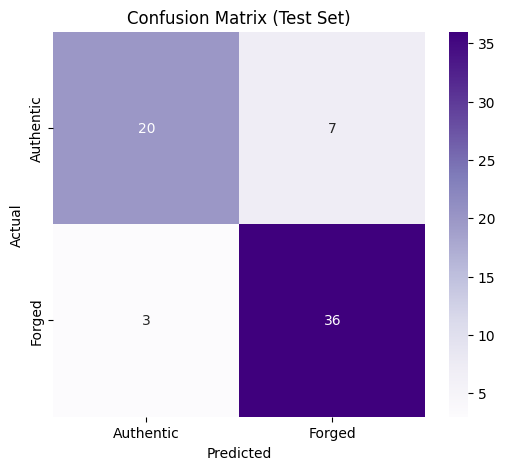

In [17]:
cm = confusion_matrix(y_test, test_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Purples",
            xticklabels=["Authentic", "Forged"],
            yticklabels=["Authentic", "Forged"])

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix (Test Set)")
plt.show()


In [18]:
# INFERENCE LATENCY BENCHMARK

num_samples = len(X_test)
start_time = time.time()
_ = rf_pipeline.predict(X_test)
end_time = time.time()
total_time = end_time - start_time
avg_latency_ms = (total_time / num_samples) * 1000

print("\n===== INFERENCE LATENCY =====")
print(f"Total Test Samples      : {num_samples}")
print(f"Total Inference Time    : {total_time:.4f} seconds")
print(f"Average Latency         : {avg_latency_ms:.2f} ms/document")


===== INFERENCE LATENCY =====
Total Test Samples      : 66
Total Inference Time    : 0.0396 seconds
Average Latency         : 0.60 ms/document


In [19]:
#  MODEL COMPARISON

print("\n==============================")
print(" BASELINE vs TRAINED MODEL")
print("==============================")

print(f"Baseline Test Accuracy : {test_acc_baseline:.4f}")
print(f"Trained Model Accuracy : {test_acc:.4f}")

improvement = test_acc - test_acc_baseline

print(f"\nImprovement: {improvement:.4f} ({improvement*100:.2f}%)")



 BASELINE vs TRAINED MODEL
Baseline Test Accuracy : 0.5909
Trained Model Accuracy : 0.8485

Improvement: 0.2576 (25.76%)


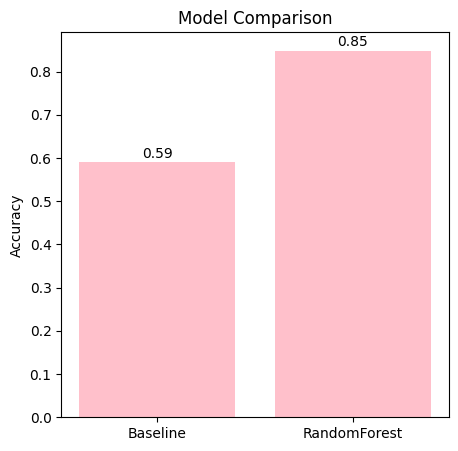

In [20]:
models = ["Baseline", "RandomForest"]
accuracies = [test_acc_baseline, test_acc]

plt.figure(figsize=(5,5))
plt.bar(models, accuracies, color= "Pink")

plt.ylabel("Accuracy")
plt.title("Model Comparison")

for i, v in enumerate(accuracies):
    plt.text(i, v + 0.01, f"{v:.2f}", ha="center")

plt.show()


#### Feature Importance

This chart highlights the most influential forensic features used by the Random Forest model. These indicators can guide compliance teams when prioritizing manual review and fraud controls.

In [21]:
# Feature importances from trained pipeline
preprocessor = rf_pipeline.named_steps["preprocessor"]
classifier = rf_pipeline.named_steps["classifier"]

feature_names = preprocessor.get_feature_names_out()
importances = pd.Series(
    classifier.feature_importances_,
    index=feature_names
).sort_values(ascending=False)

importances.head(15)


num__W_Mean                     0.094410
num__Ink_Density_Mean           0.085086
num__AR_STD                     0.082588
num__Geo_Anomaly_Ratio          0.074815
num__AR_Mean                    0.064444
num__Grad_Mean                  0.057210
num__H_Mean                     0.053826
num__W_STD                      0.053510
num__Char_Count                 0.052044
num__Num_Anomalies              0.045970
num__Ink_STD                    0.044007
num__Ink_Mean                   0.042705
num__H_STD                      0.040647
num__Clustered_Regions_Count    0.037772
num__BG_Mean                    0.036848
dtype: float64

In [22]:
results = X_test.copy()
results["True_Label"] = y_test.values
results["Predicted_Label"] = test_pred

errors = results[results["True_Label"] != results["Predicted_Label"]]
print("Misclassified test samples:", len(errors))

errors.head()


Misclassified test samples: 10


,Char_Count,Field_Detected_Count,Field_Completeness_Ratio,H_Mean,H_STD,W_Mean,W_STD,AR_Mean,AR_STD,Ink_Mean,...,Field_Count,Has_POB,Num_Anomalies,Num_Background_Anomalies,Num_OCR_Box_Anomalies,OCR_Quality,Field_Completeness,Country_Code,True_Label,Predicted_Label
4,2088,0,0.0,11.693487,13.528631,9.821360,15.557032,0.880192,0.633929,198.140246,...,0,0,2047,0,0,0.0,0.0,ALB,0,1
8,2056,0,0.0,11.700875,14.859803,9.867704,16.122887,0.885336,0.637612,199.232225,...,0,0,2010,0,0,0.0,0.0,ALB,0,1
15,1974,0,0.0,11.621581,14.393027,9.916413,16.166108,0.895308,0.647553,199.503449,...,0,0,1930,0,0,0.0,0.0,ALB,0,1
21,1979,0,0.0,11.676604,13.052176,9.959070,15.641248,0.899720,0.660591,198.408187,...,0,0,1952,0,0,0.0,0.0,ALB,0,1
22,499,0,0.0,17.647295,15.840255,20.080160,34.886900,1.100155,0.879000,164.181409,...,0,0,482,0,0,0.0,0.0,LVA,1,0


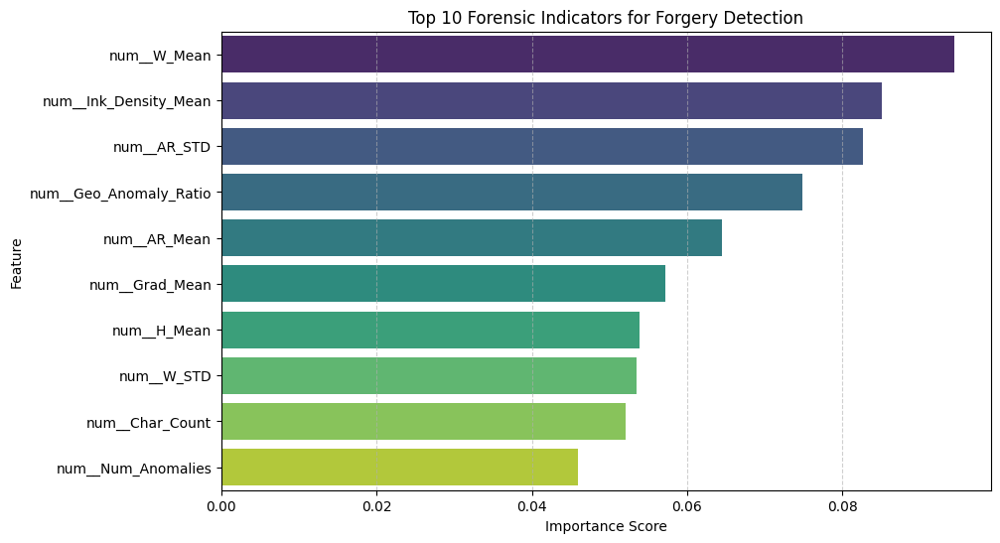

In [23]:
# Top 10 forensic indicator
top_features = importances.nlargest(10)
plt.figure(figsize=(10, 6))
top_features = importances.nlargest(10)
sns.barplot(x=top_features.values, y=top_features.index, palette="viridis")
plt.title('Top 10 Forensic Indicators for Forgery Detection')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.show()

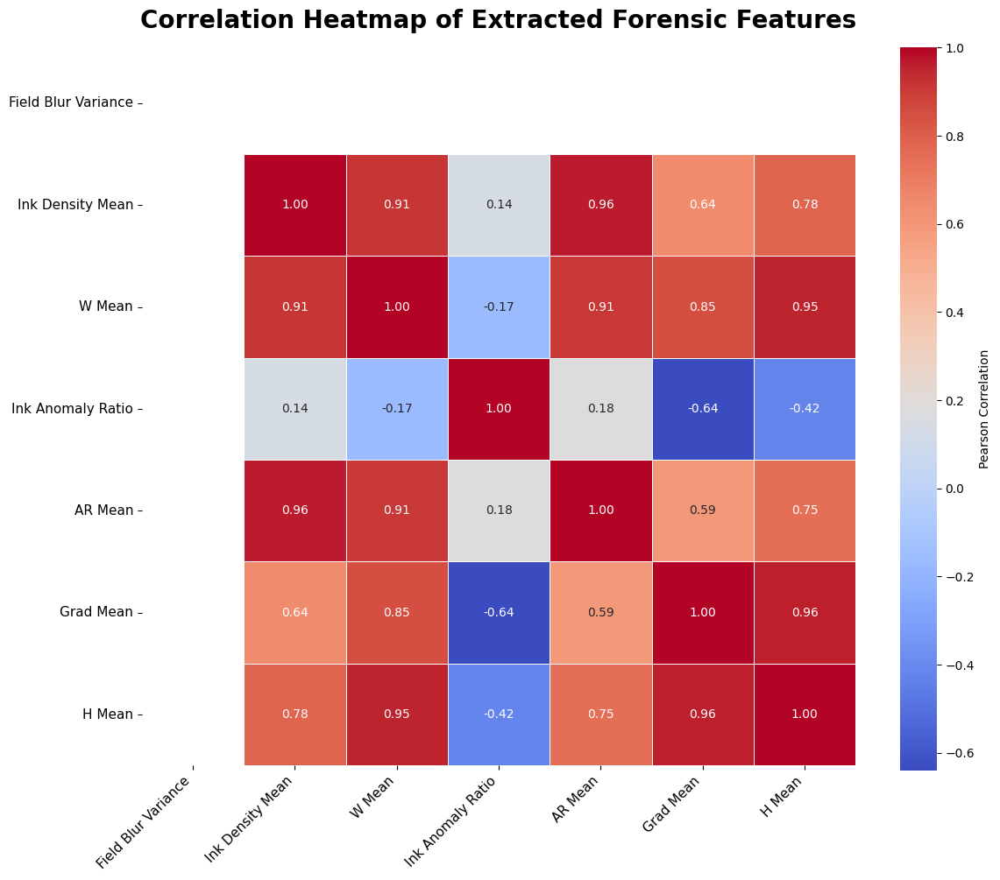

In [24]:
# FORENSIC FEATURE CORRELATION HEATMAP

# EXTRACT PREPROCESSOR
preprocessor = rf_pipeline.named_steps["preprocessor"]

# TRANSFORM FEATURES
X_processed = preprocessor.transform(X_train)

# Sparse → Dense
if hasattr(X_processed, "toarray"):

    X_processed = X_processed.toarray()

# FEATURE NAMES
feature_names = (
    preprocessor.get_feature_names_out()
)

# REMOVE COUNTRY FEATURES
filtered_indices = [
    i for i, f in enumerate(feature_names)
    if "Country" not in f
]

filtered_feature_names = [
    feature_names[i]
    for i in filtered_indices
]

X_filtered = X_processed[
    :,
    filtered_indices
]

# CLEAN FEATURE NAMES
clean_feature_names = [

    f.replace("num__", "")
     .replace("_", " ")
     .replace("STD", "Std")
     .replace("Mean", "Mean")

    for f in filtered_feature_names
]

# CREATE DATAFRAME
feature_df = pd.DataFrame(
    X_filtered,
    columns=clean_feature_names
)

# COMPUTE CORRELATION MATRIX
correlation_matrix = feature_df.corr(
    method="pearson"
)

# SELECT TOP MOST IMPORTANT FEATURES
top_features = [

    "Field Blur Variance",
    "Ink Density Mean",
    "W Mean",
    "Ink Anomaly Ratio",
    "BG STD",
    "AR Mean",
    "Grad STD",
    "Grad Mean",
    "W STD",
    "H Mean"

]

available_features = [
    f for f in top_features
    if f in correlation_matrix.columns
]

correlation_matrix = correlation_matrix.loc[
    available_features,
    available_features
]

# PLOT HEATMAP
plt.figure(figsize=(12,10))

sns.heatmap(
    correlation_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    square=True,
    linewidths=0.5,
    annot_kws={
        "size": 10
    },
    cbar_kws={
        "label": "Pearson Correlation"
    }
)

# TITLES
plt.title(
    "Correlation Heatmap of Extracted Forensic Features",
    fontsize=20,
    fontweight="bold",
    pad=20
)

plt.xticks(
    rotation=45,
    ha="right",
    fontsize=11
)

plt.yticks(
    rotation=0,
    fontsize=11
)

plt.tight_layout()

# SAVE FIGURE
plt.savefig(
    "analysis_output/feature_correlation_heatmap.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

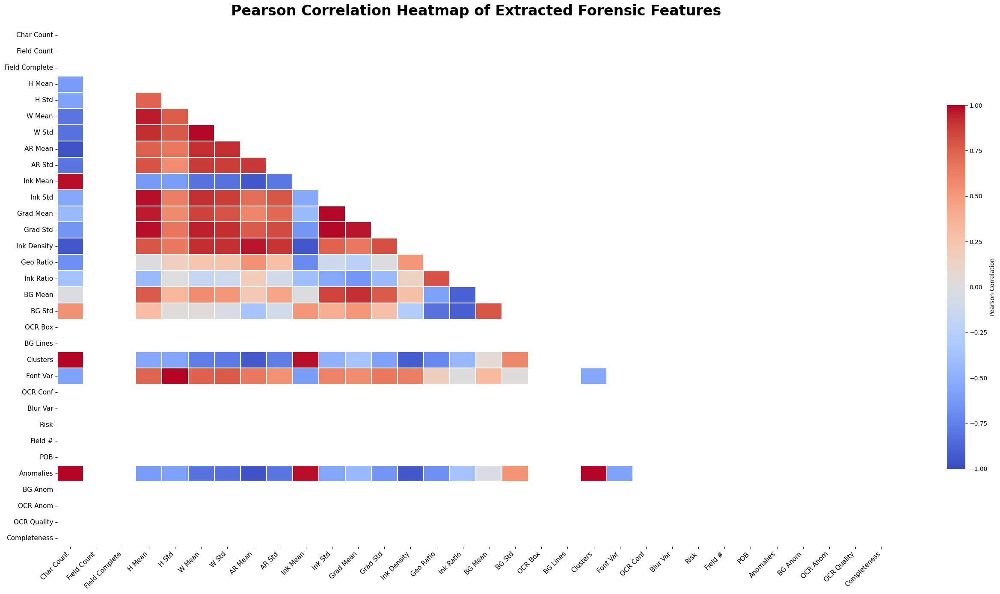

In [25]:
# PEARSON CORRELATION HEATMAP

# EXTRACT PREPROCESSOR
preprocessor = rf_pipeline.named_steps["preprocessor"]

# TRANSFORM FEATURES
X_processed = preprocessor.transform(
    X_train
)

# Sparse → Dense
if hasattr(X_processed, "toarray"):
    X_processed = (
        X_processed.toarray()
    )

# FEATURE NAMES
feature_names = (
    preprocessor.get_feature_names_out()
)

# REMOVE COUNTRY FEATURES
filtered_indices = [
    i for i, f in enumerate(feature_names)
    if "Country" not in f
]

filtered_feature_names = [
    feature_names[i]
    for i in filtered_indices
]

X_filtered = X_processed[
    :,
    filtered_indices
]

# LABELS
rename_dict = {
    "num__Char_Count":
        "Char Count",
    "num__Field_Detected_Count":
        "Field Count",
    "num__Field_Completeness_Ratio":
        "Field Complete",
    "num__H_Mean":
        "H Mean",
    "num__H_STD":
        "H Std",
    "num__W_Mean":
        "W Mean",
    "num__W_STD":
        "W Std",
    "num__AR_Mean":
        "AR Mean",
    "num__AR_STD":
        "AR Std",
    "num__Ink_Mean":
        "Ink Mean",
    "num__Ink_STD":
        "Ink Std",
    "num__Grad_Mean":
        "Grad Mean",
    "num__Grad_STD":
        "Grad Std",
    "num__Ink_Density_Mean":
        "Ink Density",
    "num__Geo_Anomaly_Ratio":
        "Geo Ratio",
    "num__Ink_Anomaly_Ratio":
        "Ink Ratio",
    "num__BG_Mean":
        "BG Mean",
    "num__BG_STD":
        "BG Std",
    "num__OCR_Box_Anomalies_Count":
        "OCR Box",
    "num__BG_Anomaly_Line_Count":
        "BG Lines",
    "num__Clustered_Regions_Count":
        "Clusters",
    "num__Font_Size_Variance":
        "Font Var",
    "num__OCR_Confidence_Mean":
        "OCR Conf",
    "num__Field_Blur_Variance":
        "Blur Var",
    "num__Risk_Score":
        "Risk",
    "num__Field_Count":
        "Field #",
    "num__Has_POB":
        "POB",
    "num__Num_Anomalies":
        "Anomalies",
    "num__Num_Background_Anomalies":
        "BG Anom",
    "num__Num_OCR_Box_Anomalies":
        "OCR Anom",
    "num__OCR_Quality":
        "OCR Quality",
    "num__Field_Completeness":
        "Completeness"
}

clean_feature_names = [
    rename_dict.get(f, f)
    for f in filtered_feature_names
]

# DATAFRAME
feature_df = pd.DataFrame(
    X_filtered,
    columns=clean_feature_names

)

# PEARSON CORRELATION
corr_matrix = feature_df.corr(
    method="pearson"
)

# UPPER TRIANGLE MASK
mask = np.triu(
    np.ones_like(
        corr_matrix,
        dtype=bool
    )
)

# LANDSCAPE FIGURE
plt.figure(figsize=(26,14))

# HEATMAP
sns.heatmap(
    corr_matrix,
    mask=mask,
    cmap="coolwarm",
    center=0,
    vmin=-1,
    vmax=1,
    linewidths=0.2,
    linecolor="white",
    square=False,
    annot=False,
    cbar_kws={
        "shrink": 0.7,
        "label": "Pearson Correlation"
    }

)

# TITLE
plt.title(
    "Pearson Correlation Heatmap of Extracted Forensic Features",
    fontsize=24,
    fontweight="bold",
    pad=20
)

# AXIS LABELS
plt.xticks(
    rotation=45,
    ha="right",
    fontsize=11
)

plt.yticks(
    rotation=0,
    fontsize=11
)

# LAYOUT
plt.tight_layout()
plt.savefig(
    "analysis_output/pearson_heatmap.png",
    dpi=600,
    bbox_inches="tight"
)
plt.show()


In [26]:
# RANDOM FOREST HYPERPARAMETER SENSITIVITY

tree_values = [50, 100, 200, 350, 500]

results = []

for n_trees in tree_values:

    temp_model = Pipeline([

        ("preprocessor", preprocessor),

        (
            "classifier",

            RandomForestClassifier(
                n_estimators=n_trees,
                random_state=42,
                class_weight="balanced"
            )
        )
    ])

    temp_model.fit(
        X_train,
        y_train
    )

    preds = temp_model.predict(
        X_test
    )

    results.append({

        "Trees": n_trees,

        "Accuracy": accuracy_score(
            y_test,
            preds
        ),

        "Recall": recall_score(
            y_test,
            preds
        ),

        "Precision": precision_score(
            y_test,
            preds
        ),

        "F1": f1_score(
            y_test,
            preds
        )
    })

tree_df = pd.DataFrame(results)

tree_df

,Trees,Accuracy,Recall,Precision,F1
0,50,0.848485,0.923077,0.837209,0.878049
1,100,0.848485,0.846154,0.891892,0.868421
2,200,0.818182,0.846154,0.846154,0.846154
3,350,0.818182,0.846154,0.846154,0.846154
4,500,0.848485,0.871795,0.871795,0.871795


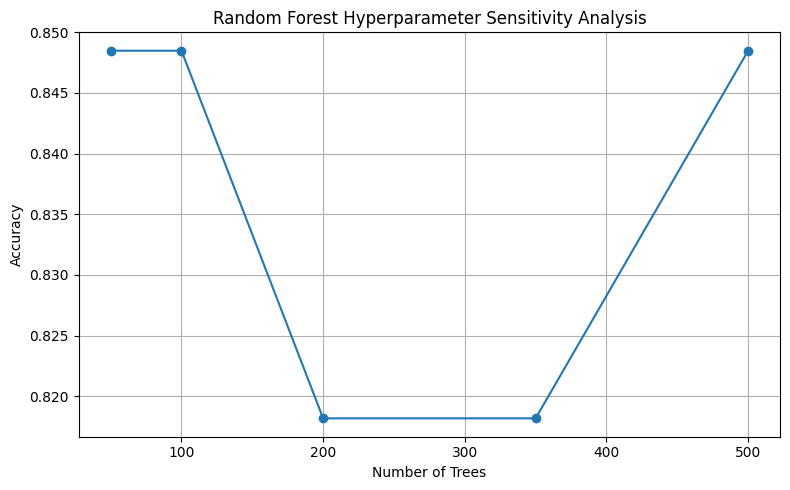

In [27]:
# TREE COUNT ANALYSIS

plt.figure(figsize=(8,5))

plt.plot(
    tree_df["Trees"],
    tree_df["Accuracy"],
    marker="o"
)

plt.xlabel(
    "Number of Trees"
)

plt.ylabel(
    "Accuracy"
)

plt.title(
    "Random Forest Hyperparameter Sensitivity Analysis"
)

plt.grid(True)

plt.tight_layout()

plt.savefig(
    "analysis_output/rf_tree_sensitivity.png",
    dpi=300
)

plt.show()

SHAP shape: (66, 32, 2)


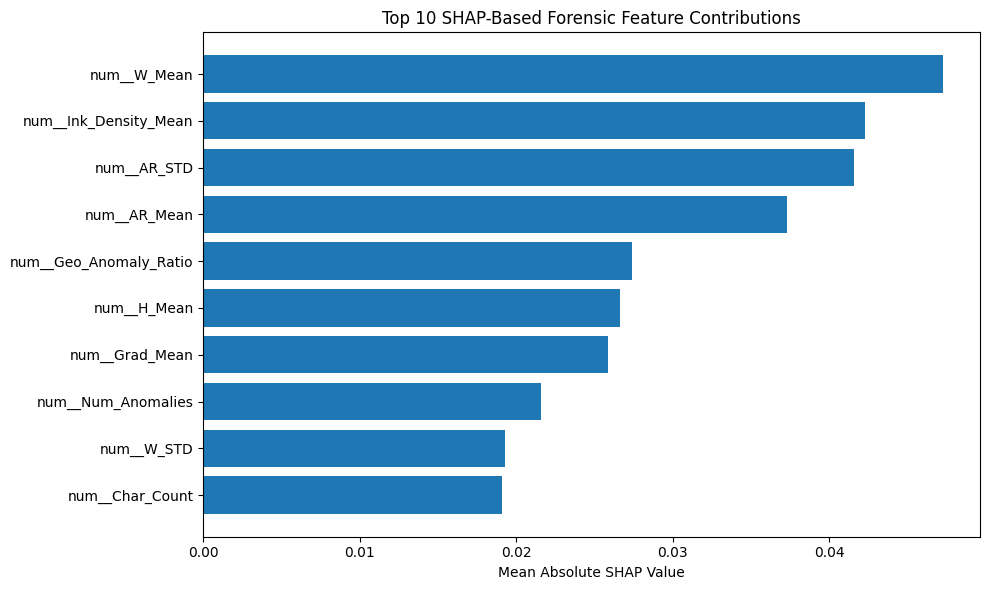

In [28]:
# SHAP FEATURE IMPORTANCE

# EXTRACT PIPELINE COMPONENTS
preprocessor = rf_pipeline.named_steps["preprocessor"]
rf_model = rf_pipeline.named_steps["classifier"]

# TRANSFORM FEATURES
X_test_transformed = preprocessor.transform(X_test)

# Convert sparse matrix if needed
if hasattr(X_test_transformed, "toarray"):
    X_test_transformed = (
        X_test_transformed.toarray()
    )

# FEATURE NAMES
feature_names = (
    preprocessor.get_feature_names_out()
)

# REMOVE COUNTRY FEATURES
filtered_indices = [
    i for i, f in enumerate(feature_names)
    if "Country" not in f
]

X_filtered = X_test_transformed[
    :,
    filtered_indices
]

filtered_feature_names = [
    feature_names[i]
    for i in filtered_indices
]

# SHAP EXPLAINER
explainer = shap.TreeExplainer(rf_model)

# COMPUTE SHAP VALUES
shap_values = explainer.shap_values(
    X_test_transformed
)

# Binary classifier fix
if isinstance(shap_values, list):
    shap_values = shap_values[1]

# Filter SHAP values
shap_filtered = shap_values[
    :,
    filtered_indices
]
\
# HANDLE MULTI-DIMENSIONAL SHAP OUTPUT
shap_array = np.array(shap_filtered)
print("SHAP shape:", shap_array.shape)

# If 3D: (samples, features, classes)
if len(shap_array.shape) == 3:
    shap_array = shap_array[:, :, 1]

# Mean importance
mean_shap = np.abs(
    shap_array
).mean(axis=0)
shap_df = pd.DataFrame({
    "Feature": filtered_feature_names,
    "Importance": mean_shap

})

shap_df = shap_df.sort_values(
    by="Importance",
    ascending=False
).head(10)

# PLOT
plt.figure(figsize=(10,6))
plt.barh(
    shap_df["Feature"][::-1],
    shap_df["Importance"][::-1]
)
plt.xlabel(
    "Mean Absolute SHAP Value"
)
plt.title(
    "Top 10 SHAP-Based Forensic Feature Contributions"
)

plt.tight_layout()

# SAVE
plt.savefig(
    "analysis_output/shap_importance.png",
    dpi=300,
    bbox_inches="tight"
)
plt.show()

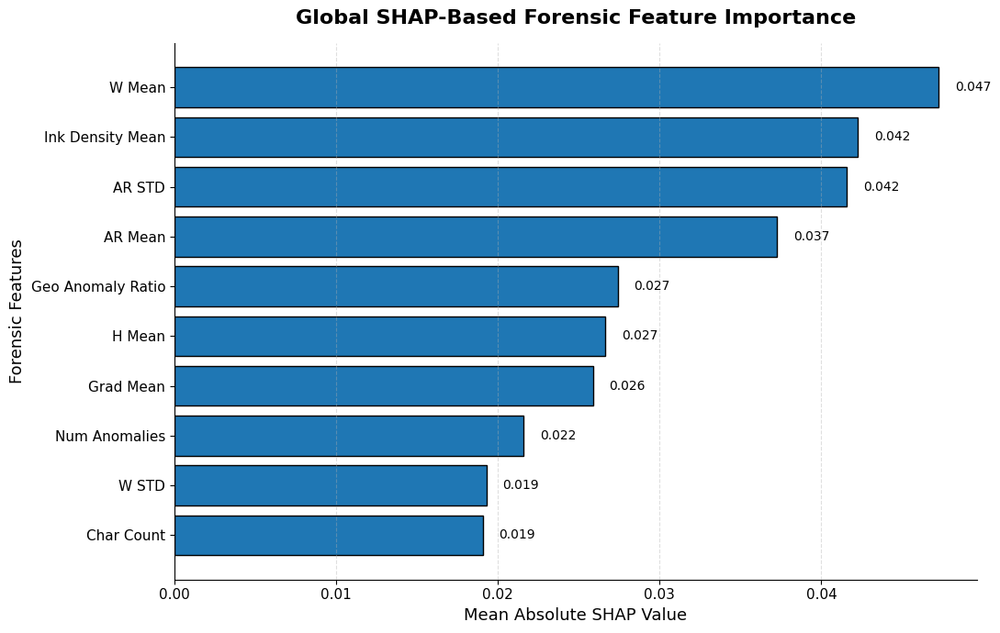

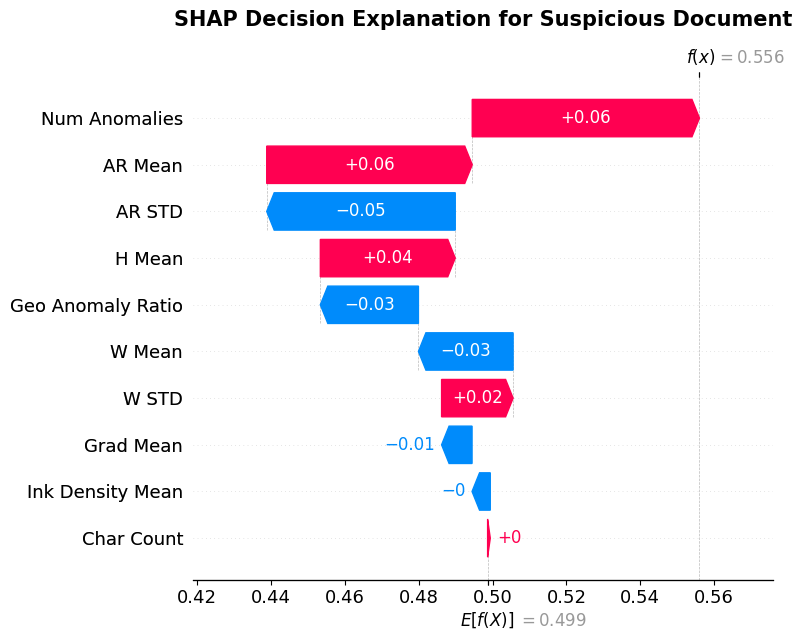

In [29]:
#  SHAP EXPLAINABILITY

# EXTRACT TRAINED PIPELINE COMPONENTS
preprocessor = rf_pipeline.named_steps["preprocessor"]
rf_model = rf_pipeline.named_steps["classifier"]

# TRANSFORM TEST FEATURES
X_test_transformed = preprocessor.transform(X_test)

# Sparse → Dense
if hasattr(X_test_transformed, "toarray"):
    X_test_transformed = (
        X_test_transformed.toarray()
    )

# FEATURE NAMES
feature_names = (
    preprocessor.get_feature_names_out()
)

# REMOVE COUNTRY FEATURES
filtered_indices = [
    i for i, feature in enumerate(feature_names)
    if "Country" not in feature

]

X_filtered = X_test_transformed[
    :,
    filtered_indices
]

filtered_feature_names = [
    feature_names[i]
    for i in filtered_indices

]

# INITIALIZE SHAP EXPLAINER
explainer = shap.TreeExplainer(
    rf_model
)

# COMPUTE SHAP VALUES
shap_values = explainer.shap_values(
    X_test_transformed
)

# HANDLE BINARY / MULTI-CLASS OUTPUT
if isinstance(shap_values, list):
    shap_values = shap_values[1]

shap_values = shap_values[
    :,
    filtered_indices
]

shap_values = np.array(
    shap_values
)

# 3D → 2D Fix
if len(shap_values.shape) == 3:
    shap_values = shap_values[:, :, 1]

# BUILD SHAP IMPORTANCE DATAFRAME
mean_shap = np.abs(
    shap_values
).mean(axis=0)

shap_df = pd.DataFrame({
    "Feature": filtered_feature_names,
    "Importance": mean_shap

})

# CLEAN FEATURE NAMES
shap_df["Feature"] = (
    shap_df["Feature"]
    .str.replace("num__", "", regex=False)
    .str.replace("_", " ", regex=False)

)

# TOP FEATURES ONLY
shap_df = shap_df.sort_values(
    by="Importance",
    ascending=False
).head(10)

# SORT FOR VISUALIZATION
plot_df = shap_df.sort_values(
    by="Importance",
    ascending=True
)

# GLOBAL FEATURE IMPORTANCE PLOT
plt.figure(figsize=(11,7))

bars = plt.barh(
    plot_df["Feature"],
    plot_df["Importance"],
    edgecolor="black"

)

# VALUE LABELS
for bar in bars:
    width = bar.get_width()
    plt.text(
        width + 0.001,
        bar.get_y() + bar.get_height()/2,
        f"{width:.3f}",
        va="center",
        fontsize=10

    )

# TITLES & LABELS
plt.title(
    "Global SHAP-Based Forensic Feature Importance",
    fontsize=16,
    weight="bold",
    pad=15

)

plt.xlabel(
    "Mean Absolute SHAP Value",
    fontsize=13

)

plt.ylabel(
    "Forensic Features",
    fontsize=13

)

plt.grid(
    axis="x",
    linestyle="--",
    alpha=0.4

)

# SPINES
ax = plt.gca()
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)

# SAVE GLOBAL PLOT
plt.tight_layout()
plt.savefig(
    "analysis_output/shap_global_importance.png",
    dpi=300,
    bbox_inches="tight"
)
plt.show()

# LOCAL DECISION EXPLANATION
sample_index = 0

# TOP FEATURE INDICES
top_feature_names = plot_df["Feature"].tolist()
top_indices = [
    i for i, feature in enumerate(filtered_feature_names)
    if feature.replace("num__", "")
              .replace("_", " ")
    in top_feature_names
]

# FILTER SAMPLE SHAP VALUES
sample_shap = shap_values[
    sample_index,
    top_indices
]

# EXPECTED VALUE FIX
expected_value = explainer.expected_value

if isinstance(expected_value, (list, np.ndarray)):
    expected_value = expected_value[1]

if isinstance(expected_value, np.ndarray):
    expected_value = expected_value.item()

# WATERFALL PLOT
shap.plots._waterfall.waterfall_legacy(
    expected_value,
    sample_shap,
    feature_names=top_feature_names,
    max_display=10,
    show=False
)

plt.title(
    "SHAP Decision Explanation for Suspicious Document",
    fontsize=15,
    weight="bold",
    pad=15
)

plt.tight_layout()

plt.savefig(
    "analysis_output/shap_waterfall.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

In [30]:
# FEATURE GROUP DEFINITIONS
feature_groups = {

    "Blur Features": [
        "Field_Blur_Variance"
    ],

    "OCR Semantic Features": [
        "Field_Detected_Count",
        "Field_Completeness_Ratio",
        "OCR_Confidence_Mean",
        "Risk_Score"
    ],

    "Texture Features": [
        "Ink_Mean",
        "Ink_STD",
        "Ink_Density_Mean",
        "BG_Mean",
        "BG_STD",
        "Grad_Mean",
        "Grad_STD"
    ],

    "Geometric Features": [
        "H_Mean",
        "H_STD",
        "W_Mean",
        "W_STD",
        "AR_Mean",
        "AR_STD",
        "Font_Size_Variance"
    ],

    "Anomaly Features": [
        "Geo_Anomaly_Ratio",
        "Ink_Anomaly_Ratio",
        "OCR_Box_Anomalies_Count",
        "BG_Anomaly_Line_Count",
        "Clustered_Regions_Count"
    ]
}

In [31]:
baseline_recall = testing_metrics["recall"]

In [32]:
# FEATURE GROUP ABLATION

feature_ablation_results = []

for group_name, remove_features in feature_groups.items():
    print(f"\n[INFO] Removing: {group_name}")

    # Copy datasets
    X_train_ablation = X_train.copy()
    X_test_ablation = X_test.copy()

    # Remove features
    cols_to_remove = [
        c for c in remove_features
        if c in X_train_ablation.columns
    ]

    X_train_ablation = X_train_ablation.drop(
        columns=cols_to_remove,
        errors="ignore"
    )

    X_test_ablation = X_test_ablation.drop(
        columns=cols_to_remove,
        errors="ignore"
    )

    # PREPROCESSING PIPELINE FOR ABLATION
    categorical_ablation = [
        c for c in ["Country_Code", "Country_Name"]
        if c in X_train_ablation.columns
    ]

    numerical_ablation = [
        c for c in X_train_ablation.columns
        if c not in categorical_ablation
    ]

    preprocessor_ablation = ColumnTransformer(
        transformers=[
            (
                "cat",
                Pipeline([
                    (
                        "imputer",
                        SimpleImputer(strategy="most_frequent")
                    ),
                    (
                        "onehot",
                        OneHotEncoder(handle_unknown="ignore")
                    ),
                ]),
                categorical_ablation,
            ),

            (
                "num",
                Pipeline([
                    (
                        "imputer",
                        SimpleImputer(strategy="median")
                    ),
                ]),
                numerical_ablation,
            ),
        ],
        remainder="drop",
    )

    # ABLATION MODEL
    ablation_model = Pipeline([
        (
            "preprocessor",
            preprocessor_ablation
        ),

        (
            "classifier",
            RandomForestClassifier(
                n_estimators=50,
                random_state=42,
                class_weight="balanced"
            ),
        ),
    ])

    ablation_model.fit(
        X_train_ablation,
        y_train
    )

    preds = ablation_model.predict(X_test_ablation)
    recall = recall_score(y_test, preds)
    accuracy = accuracy_score(y_test, preds)
    f1 = f1_score(y_test, preds)
    recall_drop = (
        baseline_recall - recall
    ) * 100

    feature_ablation_results.append({
        "Feature Removed": group_name,
        "Accuracy (%)":
            round(accuracy * 100, 2),
        "Recall (%)":
            round(recall * 100, 2),
        "Recall Drop (%)":
            round(recall_drop, 2),
        "F1-Score (%)":
            round(f1 * 100, 2),
    })

feature_ablation_df = pd.DataFrame(
    feature_ablation_results
)

print("\n===== FEATURE GROUP ABLATION =====")
display(feature_ablation_df)


[INFO] Removing: Blur Features

[INFO] Removing: OCR Semantic Features

[INFO] Removing: Texture Features

[INFO] Removing: Geometric Features

[INFO] Removing: Anomaly Features

===== FEATURE GROUP ABLATION =====


,Feature Removed,Accuracy (%),Recall (%),Recall Drop (%),F1-Score (%)
0,Blur Features,81.82,84.62,7.69,84.62
1,OCR Semantic Features,81.82,82.05,10.26,84.21
2,Texture Features,75.76,71.79,20.51,77.78
3,Geometric Features,87.88,84.62,7.69,89.19
4,Anomaly Features,75.76,82.05,10.26,80.00


In [33]:
# CUMULATIVE FEATURE REMOVAL
cumulative_order = [
    "Blur Features",
    "OCR Semantic Features",
    "Texture Features",
    "Geometric Features",
]

removed_so_far = []
cumulative_results = []

for group in cumulative_order:
    removed_so_far.extend(
        feature_groups[group]
    )
    
    X_train_cum = X_train.drop(
        columns=removed_so_far,
        errors="ignore"
    )
    X_test_cum = X_test.drop(
        columns=removed_so_far,
        errors="ignore"
    )

    # PREPROCESSING
    categorical_cum = [
        c for c in ["Country_Code", "Country_Name"]
        if c in X_train_cum.columns
    ]

    numerical_cum = [
        c for c in X_train_cum.columns
        if c not in categorical_cum
    ]

    preprocessor_cum = ColumnTransformer(
        transformers=[
            (
                "cat",
                Pipeline([
                    (
                        "imputer",
                        SimpleImputer(strategy="most_frequent")
                    ),
                    (
                        "onehot",
                        OneHotEncoder(handle_unknown="ignore")
                    ),
                ]),
                categorical_cum,
            ),
            (
                "num",
                Pipeline([
                    (
                        "imputer",
                        SimpleImputer(strategy="median")
                    ),
                ]),
                numerical_cum,
            ),
        ],
        remainder="drop",
    )

    # CUMULATIVE MODEL
    model_cum = Pipeline([
        (
            "preprocessor",
            preprocessor_cum
        ),
        (
            "classifier",
            RandomForestClassifier(
                n_estimators=50,
                random_state=42,
                class_weight="balanced"
            ),
        ),
    ])

    model_cum.fit(X_train_cum, y_train)
    preds = model_cum.predict(X_test_cum)
    recall = recall_score(y_test, preds)
    cumulative_results.append({
        "Removed So Far": ", ".join(
            cumulative_order[
                :len(cumulative_results)+1
            ]
        ),
        "Recall (%)":
            round(recall * 100, 2)
    })

cumulative_df = pd.DataFrame(
    cumulative_results
)

display(cumulative_df)

,Removed So Far,Recall (%)
0,Blur Features,84.62
1,"Blur Features, OCR Semantic Features",89.74
2,"Blur Features, OCR Semantic Features, Texture ...",79.49
3,"Blur Features, OCR Semantic Features, Texture ...",58.97


In [34]:
# Executive-ready summary table
summary_rows = [
    {
        "Dataset": "Validation Set",
        "Accuracy": validation_metrics["accuracy"],
        "Balanced Accuracy": validation_metrics["balanced_accuracy"],
        "Precision": validation_metrics["precision"],
        "Recall": validation_metrics["recall"],
        "F1-Score": validation_metrics["f1_score"],
        "False Positive Rate": validation_metrics["false_positive_rate"],
        "False Negative Rate": validation_metrics["false_negative_rate"],
    },
    {
        "Dataset": "Testing Set",
        "Accuracy": testing_metrics["accuracy"],
        "Balanced Accuracy": testing_metrics["balanced_accuracy"],
        "Precision": testing_metrics["precision"],
        "Recall": testing_metrics["recall"],
        "F1-Score": testing_metrics["f1_score"],
        "False Positive Rate": testing_metrics["false_positive_rate"],
        "False Negative Rate": testing_metrics["false_negative_rate"],
    },
]

summary_df = pd.DataFrame(summary_rows)
summary_df.style.format({
        "Accuracy": "{:.4f}",
        "Balanced Accuracy": "{:.4f}",
        "Precision": "{:.4f}",
        "Recall": "{:.4f}",
        "F1-Score": "{:.4f}",
        "False Positive Rate": "{:.4f}",
        "False Negative Rate": "{:.4f}",
})


,Dataset,Accuracy,Balanced Accuracy,Precision,Recall,F1-Score,False Positive Rate,False Negative Rate
0,Validation Set,0.8261,0.8261,0.8235,0.8235,0.8235,0.1714,0.1765
1,Testing Set,0.8485,0.8319,0.8372,0.9231,0.8780,0.2593,0.0769


In [35]:
MODEL_PATH = "trained_models/forged_document_rf_model.pkl"

with open(MODEL_PATH, "wb") as f:
    pickle.dump(rf_pipeline, f)

print(f"[INFO] Model saved to {MODEL_PATH}")


[INFO] Model saved to trained_models/forged_document_rf_model.pkl


### AML Model Empirical Evaluation

This notebook evaluates the trained model on the strict test split (`dataset_outputs/test.csv`) and reports AML + Rule-Based metrics.

In [36]:
# Load data
df_test = pd.read_csv("dataset_outputs/test.csv")

with open("trained_models/forged_document_rf_model.pkl", "rb") as f:
    rf_pipeline = pickle.load(f)

X_test = df_test.drop(columns=["Label", "Image_Name"], errors="ignore")
y_test = df_test["Label"]

expected_features = rf_pipeline.named_steps["preprocessor"].feature_names_in_
for col in expected_features:
    if col not in X_test.columns:
        X_test[col] = 0
X_test = X_test[list(expected_features)]

y_pred = rf_pipeline.predict(X_test)
y_proba = rf_pipeline.predict_proba(X_test)[:, 1]

# AML METRICS calculation
cm = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = cm.ravel()

accuracy = (tp + tn) / (tp + tn + fp + fn)
precision = tp / (tp + fp + 1e-6)
sensitivity = tp / (tp + fn + 1e-6)
specificity = tn / (tn + fp + 1e-6)
fpr = fp / (fp + tn + 1e-6)
roc_auc = roc_auc_score(y_test, y_proba)

print("===== AML METRICS =====")
print(f"Accuracy                        : {accuracy:.4f}")
print(f"Precision (Detection Rate)      : {precision:.4f}")
print(f"Sensitivity                     : {sensitivity:.4f}")
print(f"Specificity                     : {specificity:.4f}")
print(f"FPR                             : {fpr:.4f}")
print(f"ROC-AUC                         : {roc_auc:.4f}")
print("Unique predictions:", np.unique(y_pred))


===== AML METRICS =====
Accuracy                        : 0.8485
Precision (Detection Rate)      : 0.8372
Sensitivity                     : 0.9231
Specificity                     : 0.7407
FPR                             : 0.2593
ROC-AUC                         : 0.9188
Unique predictions: [0 1]


In [37]:
# Detected Field Count

def estimate_detected_fields(row):
  country_code = row.get("Country_Code", "UNKNOWN")
  country_map = {
      "ALB": "ALBANIA",
      "LVA": "LATVIA",
      "SVK": "SLOVAKIA"
    }
    
  country = country_map.get(country_code, "ALBANIA")
  expected_fields = COUNTRY_REQUIRED_FIELDS.get(country, [])
  expected_count = len(expected_fields)
  completeness = row.get("Field_Completeness", 0)
  return completeness * expected_count

# Recall
def compute_country_recall(row):
  country_code = row.get("Country_Code", "ALB")
  country_map = {
        "ALB": "ALBANIA",
        "LVA": "LATVIA",
        "SVK": "SLOVAKIA"
    }
  country = country_map.get(country_code, "ALBANIA")
  expected_fields = COUNTRY_REQUIRED_FIELDS.get(country, [])
  expected_count = len(expected_fields)
  detected = estimate_detected_fields(row)
  return detected / (expected_count + 1e-6)
df_test["Field_Recall"] = df_test.apply(compute_country_recall, axis=1)

# Precision
def compute_country_precision(row):
    detected = estimate_detected_fields(row)
    # assume detected ≈ correct (approximation)
    correct = detected
    return correct / (detected + 1e-6)
df_test["Field_Precision"] = df_test.apply(compute_country_precision, axis=1)

def compute_country_f1(row):
    p = row["Field_Precision"]
    r = row["Field_Recall"]
    return 2 * (p * r) / (p + r + 1e-6)
df_test["Field_F1"] = df_test.apply(compute_country_f1, axis=1)

# FIELD EVALUATION
print("\n===== FIELD EVALUATION =====")
print(f"Field Completeness     : {df_test['Field_Completeness'].mean():.4f}")
print(f"Field Recall (avg)       : {df_test['Field_Recall'].mean():.4f}")
print(f"Field Precision (avg)    : {df_test['Field_Precision'].mean():.4f}")
print(f"Field F1-score (avg)     : {df_test['Field_F1'].mean():.4f}")




===== FIELD EVALUATION =====
Field Completeness     : 0.0000
Field Recall (avg)       : 0.0000
Field Precision (avg)    : 0.0000
Field F1-score (avg)     : 0.0000


In [38]:
# PREPROCESS FEATURES FOR RANDOM FOREST
preprocessor = rf_pipeline.named_steps["preprocessor"]

# TRANSFORM TRAIN/TEST FEATURES
X_train_processed = preprocessor.transform(
    X_train
)

X_test_processed = preprocessor.transform(
    X_test
)

# SPARSE → DENSE
if hasattr(X_train_processed, "toarray"):

    X_train_processed = (
        X_train_processed.toarray()
    )

if hasattr(X_test_processed, "toarray"):

    X_test_processed = (
        X_test_processed.toarray()
    )

print(
    "Processed train shape:",
    X_train_processed.shape
)

print(
    "Processed test shape:",
    X_test_processed.shape
)

Processed train shape: (315, 35)
Processed test shape: (66, 35)


### Statistical Rigour Evaluation

In [39]:

# REPEATED TRAINING RUNS
num_runs = 10
accuracy_scores = []
recall_scores = []
precision_scores = []
f1_scores = []

# MULTIPLE RANDOM INITIALIZATIONS
for seed in range(num_runs):
    temp_model = RandomForestClassifier(
        n_estimators=50,
        random_state=seed,
        class_weight="balanced"
    )

    temp_model.fit(
        X_train_processed,
        y_train
    )

    preds = temp_model.predict(
        X_test_processed
    )

    accuracy_scores.append(
        accuracy_score(y_test, preds)
    )

    recall_scores.append(
        recall_score(y_test, preds)
    )

    precision_scores.append(
        precision_score(y_test, preds)
    )

    f1_scores.append(
        f1_score(y_test, preds)
    )

# METRIC SUMMARY
metrics_df = pd.DataFrame({

    "Metric": [
        "Accuracy",
        "Recall",
        "Precision",
        "F1-Score"
    ],

    "Mean": [
        np.mean(accuracy_scores),
        np.mean(recall_scores),
        np.mean(precision_scores),
        np.mean(f1_scores)
    ],

    "STD": [
        np.std(accuracy_scores),
        np.std(recall_scores),
        np.std(precision_scores),
        np.std(f1_scores)
    ]

})

print("\n===== REPEATED RUN STATISTICS =====")
display(metrics_df)


===== REPEATED RUN STATISTICS =====


,Metric,Mean,STD
0,Accuracy,0.824242,0.028907
1,Recall,0.846154,0.022934
2,Precision,0.856118,0.034237
3,F1-Score,0.850712,0.022784


### Bootstrap Confidence Intervals


===== BOOTSTRAP CONFIDENCE INTERVAL =====
F1-Score 95% CI: [0.8000, 0.9451]


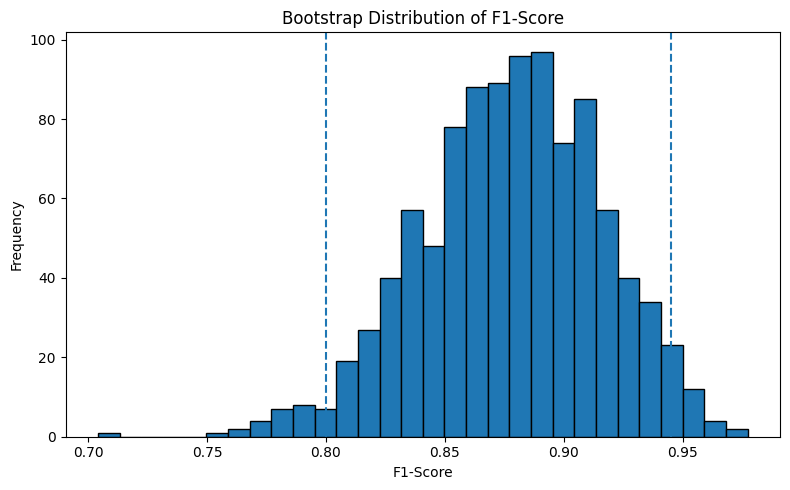

In [40]:

bootstrap_iterations = 1000
bootstrap_f1 = []

# BOOTSTRAP SAMPLING
for i in range(bootstrap_iterations):

    X_bs, y_bs = resample(
        X_test,
        y_test,
        replace=True,
        random_state=i
    )

    preds_bs = rf_pipeline.predict(X_bs)
    bootstrap_f1.append(
        f1_score(y_bs, preds_bs)
    )

# 95% CONFIDENCE INTERVAL
lower_ci = np.percentile(
    bootstrap_f1,
    2.5
)

upper_ci = np.percentile(
    bootstrap_f1,
    97.5
)

print("\n===== BOOTSTRAP CONFIDENCE INTERVAL =====")
print(
    f"F1-Score 95% CI: "
    f"[{lower_ci:.4f}, {upper_ci:.4f}]"
)

# VISUALIZATION
plt.figure(figsize=(8,5))
plt.hist(
    bootstrap_f1,
    bins=30,
    edgecolor="black"
)
plt.axvline(
    lower_ci,
    linestyle="--"
)
plt.axvline(
    upper_ci,
    linestyle="--"
)
plt.title(
    "Bootstrap Distribution of F1-Score"
)
plt.xlabel(
    "F1-Score"
)
plt.ylabel(
    "Frequency"
)
plt.tight_layout()
plt.savefig(
    "analysis_output/bootstrap_confidence_interval.png",
    dpi=300,
    bbox_inches="tight"
)
plt.show()

### K-Fold Cross Validation

In [41]:
# 5-FOLD CROSS VALIDATION

cv = StratifiedKFold(
    n_splits=5,
    shuffle=True,
    random_state=42
)

scoring = {
    "accuracy": "accuracy",
    "precision": "precision",
    "recall": "recall",
    "f1": "f1",
    "roc_auc": "roc_auc",
}

cv_results = cross_validate(
    rf_pipeline,
    X_train,
    y_train,
    cv=cv,
    scoring=scoring,
    n_jobs=-1,
    return_train_score=False
)

print("\n===== 5-FOLD CROSS VALIDATION RESULTS =====")

for metric in scoring.keys():
    scores = cv_results[f"test_{metric}"]
    print(
        f"{metric.upper():<10}: "
        f"{scores.mean():.4f} ± {scores.std():.4f}"
    )


===== 5-FOLD CROSS VALIDATION RESULTS =====
ACCURACY  : 0.8571 ± 0.0402
PRECISION : 0.8533 ± 0.0481
RECALL    : 0.8865 ± 0.0362
F1        : 0.8689 ± 0.0363
ROC_AUC   : 0.9241 ± 0.0335


### Equal Error Rate (EER)

Equal Error Rate is the operating point where: False Positive Rate = False Negative Rate.
Lower EER means better authentication performance.

In [42]:
# Predicted probabilities
y_prob = rf_pipeline.predict_proba(X_test)[:, 1]

# ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
fnr = 1 - tpr

# Compute EER
eer = brentq(lambda x: 1. - x - interp1d(fpr, tpr)(x), 0., 1.)
eer_threshold = interp1d(fpr, thresholds)(eer)

print(f"Equal Error Rate (EER): {eer:.4f}")
print(f"EER Threshold: {eer_threshold:.4f}")

Equal Error Rate (EER): 0.1852
EER Threshold: 0.5600


In [43]:
# ROC / PR / DET CURVES
from sklearn.metrics import (
    roc_curve,
    precision_recall_curve,
    det_curve,
    auc
)

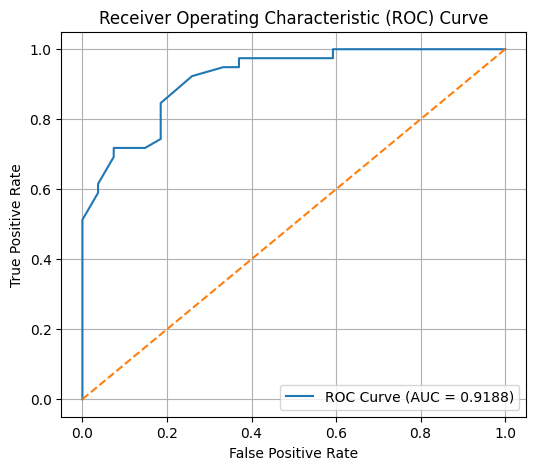

In [44]:
# ROC CURVE
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 5))

plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {roc_auc:.4f})")
plt.plot([0, 1], [0, 1], linestyle="--")

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic (ROC) Curve")
plt.legend()

plt.grid(True)
plt.show()

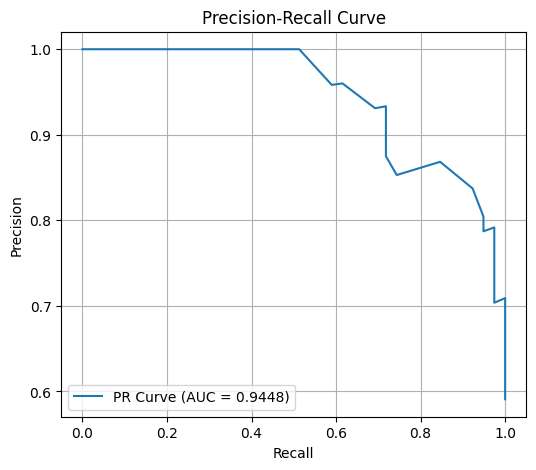

In [45]:
# PRECISION-RECALL CURVE
precision_curve, recall_curve, _ = precision_recall_curve(
    y_test,
    y_prob
)

pr_auc = auc(recall_curve, precision_curve)

plt.figure(figsize=(6, 5))

plt.plot(
    recall_curve,
    precision_curve,
    label=f"PR Curve (AUC = {pr_auc:.4f})"
)

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve")
plt.legend()

plt.grid(True)
plt.show()


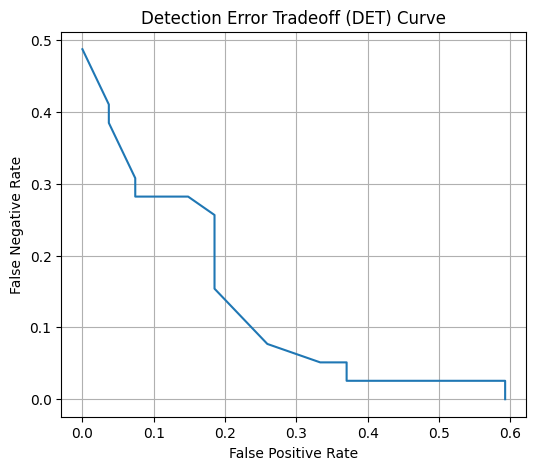

In [46]:

# DET CURVE
fpr_det, fnr_det, _ = det_curve(y_test, y_prob)

plt.figure(figsize=(6, 5))

plt.plot(fpr_det, fnr_det)

plt.xlabel("False Positive Rate")
plt.ylabel("False Negative Rate")
plt.title("Detection Error Tradeoff (DET) Curve")

plt.grid(True)
plt.show()

### Ablation Study

In [47]:
# FEATURE GROUPS
semantic_features = [
    "Field_Completeness_Ratio",
    "Risk_Score",
    "Field_Completeness",
    "Field_Count",
]

blur_geometry_features = [
    "Field_Blur_Variance",
    "W_Mean",
    "W_STD",
    "H_Mean",
    "H_STD",
    "AR_Mean",
    "AR_STD",
    "Grad_Mean",
    "Grad_STD",
]

ocr_quality_features = [
    "OCR_Confidence_Mean",
    "OCR_Confidence_STD",
    "Low_Confidence_Ratio",
]

In [48]:
# ABLATION FUNCTION

def run_experiment(
    experiment_name,
    remove_features=None,
    classifier_type="rf",
    selected_features=None,
):

    remove_features = remove_features or []

    X_train_exp = X_train.copy()
    X_test_exp = X_test.copy()

    # Remove feature groups
    X_train_exp = X_train_exp.drop(columns=remove_features, errors="ignore")
    X_test_exp = X_test_exp.drop(columns=remove_features, errors="ignore")

    # Keep selected features only
    if selected_features is not None:
        X_train_exp = X_train_exp[selected_features]
        X_test_exp = X_test_exp[selected_features]

    categorical_exp = [
        c for c in ["Country_Code", "Country_Name"]
        if c in X_train_exp.columns
    ]

    numerical_exp = [
        c for c in X_train_exp.columns
        if c not in categorical_exp
    ]

    preprocessor_exp = ColumnTransformer(
        transformers=[
            (
                "cat",
                Pipeline([
                    ("imputer", SimpleImputer(strategy="most_frequent")),
                    ("onehot", OneHotEncoder(handle_unknown="ignore")),
                ]),
                categorical_exp,
            ),
            (
                "num",
                Pipeline([
                    ("imputer", SimpleImputer(strategy="median")),
                ]),
                numerical_exp,
            ),
        ]
    )

    # Classifier selection
    if classifier_type == "rf":
        classifier = RandomForestClassifier(
            n_estimators=50,
            random_state=42,
            class_weight="balanced",
        )

    elif classifier_type == "svm":
        classifier = SVC(probability=True)

    elif classifier_type == "xgb":
        classifier = XGBClassifier(
            n_estimators=200,
            random_state=42,
            eval_metric="logloss"
        )

    model_exp = Pipeline([
        ("preprocessor", preprocessor_exp),
        ("classifier", classifier),
    ])

    model_exp.fit(X_train_exp, y_train)

    preds = model_exp.predict(X_test_exp)

    precision, recall, f1, _ = precision_recall_fscore_support(
        y_test,
        preds,
        average="binary",
        zero_division=0,
    )

    accuracy = accuracy_score(y_test, preds)

    return {
        "Configuration": experiment_name,
        "Accuracy": round(accuracy * 100, 2),
        "Recall": round(recall * 100, 2),
        "F1-Score": round(f1 * 100, 2),
    }


In [49]:

# RUN EXPERIMENTS
ablation_results = []

# Full model
ablation_results.append(
    run_experiment("Full 32-Feature Model")
)

# Remove semantic
ablation_results.append(
    run_experiment(
        "Without Semantic Features",
        remove_features=semantic_features
    )
)

# Remove blur/geometry
ablation_results.append(
    run_experiment(
        "Without Blur/Geometry Features",
        remove_features=blur_geometry_features
    )
)

# Remove OCR quality
ablation_results.append(
    run_experiment(
        "Without OCR Quality Features",
        remove_features=ocr_quality_features
    )
)

# Top-10 features only
top10_features = [
    feature.replace("num__", "").replace("cat__", "")
    for feature in importances.nlargest(10).index.tolist()
]

ablation_results.append(
    run_experiment(
        "Top-10 Features Only",
        selected_features=top10_features
    )
)

# SVM
ablation_results.append(
    run_experiment(
        "Support Vector Machine (SVM)",
        classifier_type="svm"
    )
)

# XGBoost
ablation_results.append(
    run_experiment(
        "XGBoost",
        classifier_type="xgb"
    )
)

# RESULTS TABLE
ablation_df = pd.DataFrame(ablation_results)

print("\n===== ABLATION STUDY RESULTS =====")
display(ablation_df)


===== ABLATION STUDY RESULTS =====


,Configuration,Accuracy,Recall,F1-Score
0,Full 32-Feature Model,84.85,92.31,87.80
1,Without Semantic Features,80.30,82.05,83.12
2,Without Blur/Geometry Features,80.30,69.23,80.60
3,Without OCR Quality Features,81.82,84.62,84.62
4,Top-10 Features Only,78.79,84.62,82.50
5,Support Vector Machine (SVM),59.09,100.00,74.29
6,XGBoost,81.82,89.74,85.37


### Cross-Country Generalization Evaluation

In [50]:
country_experiments = [
    {
        "train": ["ALB", "LVA"],
        "test": "SVK",
        "name": "Train(ALB+LVA) → Test(SVK)"
    },
    {
        "train": ["ALB", "SVK"],
        "test": "LVA",
        "name": "Train(ALB+SVK) → Test(LVA)"
    },
    {
        "train": ["LVA", "SVK"],
        "test": "ALB",
        "name": "Train(LVA+SVK) → Test(ALB)"
    }
]

cross_country_results = []

for exp in country_experiments:
    # Training subset
    train_subset = df_train_raw[
        df_train_raw["Country_Code"].isin(exp["train"])
    ]
    # Testing subset
    test_subset = df_test[
        df_test["Country_Code"] == exp["test"]
    ]
    # Split
    X_train_cc = train_subset.drop(columns=["Label"])
    y_train_cc = train_subset["Label"]

    X_test_cc = test_subset.drop(columns=["Label"])
    y_test_cc = test_subset["Label"]
    # Remove leakage columns
    X_train_cc = drop_leakage_columns(X_train_cc)
    X_test_cc = drop_leakage_columns(X_test_cc)
    # Train model
    model_cc = Pipeline([
        ("preprocessor", preprocessor),
        ("classifier",
            RandomForestClassifier(
                n_estimators=50,
                random_state=42,
                class_weight="balanced"
            )
        ),
    ])

    model_cc.fit(X_train_cc, y_train_cc)
    
    # Predict
    y_pred_cc = model_cc.predict(X_test_cc)

    # Metrics
    result = {
        "Experiment": exp["name"],
        "Accuracy": accuracy_score(y_test_cc, y_pred_cc),
        "Precision": precision_score(y_test_cc, y_pred_cc, zero_division=0),
        "Recall": recall_score(y_test_cc, y_pred_cc, zero_division=0),
        "F1-Score": f1_score(y_test_cc, y_pred_cc, zero_division=0),
    }

    cross_country_results.append(result)

# Results table
cross_country_df = pd.DataFrame(cross_country_results)
print("\n===== CROSS-COUNTRY GENERALIZATION =====")
cross_country_df

[WARN] Dropping leakage/pre-encoded columns: ['Image_Name']
[WARN] Dropping leakage/pre-encoded columns: ['Image_Name']
[WARN] Dropping leakage/pre-encoded columns: ['Image_Name']
[WARN] Dropping leakage/pre-encoded columns: ['Image_Name']
[WARN] Dropping leakage/pre-encoded columns: ['Image_Name']
[WARN] Dropping leakage/pre-encoded columns: ['Image_Name']

===== CROSS-COUNTRY GENERALIZATION =====


,Experiment,Accuracy,Precision,Recall,F1-Score
0,Train(ALB+LVA) → Test(SVK),0.590909,0.590909,1.0,0.742857
1,Train(ALB+SVK) → Test(LVA),0.636364,0.636364,1.0,0.777778
2,Train(LVA+SVK) → Test(ALB),0.454545,0.000000,0.0,0.000000


In [51]:
# Rerain Full Pipeline (Preprocessing + RandomForest)

preprocessor = ColumnTransformer(
    transformers=[
        (
            "cat",
            Pipeline([
                ("imputer", SimpleImputer(strategy="most_frequent")),
                ("onehot", OneHotEncoder(handle_unknown="ignore")),
            ]),
            categorical_features,
        ),
        (
            "num",
            Pipeline([
                ("imputer", SimpleImputer(strategy="median")),
            ]),
            numerical_features,
        ),
    ],
    remainder="drop",
)

rf_pipeline = Pipeline([
    ("preprocessor", preprocessor),
    (
        "classifier",
        RandomForestClassifier(
            n_estimators=50,
            random_state=42,
            class_weight="balanced",
        ),
    ),
])

rf_pipeline.fit(X_train, y_train)

print("[INFO] Full sklearn pipeline trained (preprocessing + classifier).")


[INFO] Full sklearn pipeline trained (preprocessing + classifier).


### Robustness Analysis

In [52]:
# ROBUSTNESS TRANSFORMATIONS

import cv2
import numpy as np

def apply_gaussian_blur(image):
    return cv2.GaussianBlur(image, (5,5), 0)

def apply_jpeg_compression(image, quality=30):
    encode_param = [int(cv2.IMWRITE_JPEG_QUALITY), quality]
    _, encimg = cv2.imencode('.jpg', image, encode_param)
    return cv2.imdecode(encimg, 1)

def apply_low_illumination(image):
    return np.clip(image * 0.5, 0, 255).astype(np.uint8)

def apply_glare(image):

    glare = image.copy().astype(np.float32)

    h, w = glare.shape[:2]

    cv2.circle(
        glare,
        (w//2, h//2),
        min(h,w)//4,
        (255,255,255),
        -1
    )

    glare = cv2.addWeighted(
        glare,
        0.3,
        image.astype(np.float32),
        0.7,
        0
    )

    return np.clip(glare, 0, 255).astype(np.uint8)

def apply_perspective_distortion(image):

    h, w = image.shape[:2]

    src = np.float32([
        [0,0],
        [w,0],
        [0,h],
        [w,h]
    ])

    dst = np.float32([
        [20,30],
        [w-30,10],
        [30,h-20],
        [w-20,h-30]
    ])

    matrix = cv2.getPerspectiveTransform(src, dst)

    return cv2.warpPerspective(image, matrix, (w,h))

def apply_print_scan_simulation(image):
    blurred = cv2.GaussianBlur(image, (3,3), 0)
    noise = np.random.normal(0, 8, blurred.shape)
    noisy = blurred + noise
    return np.clip(noisy, 0, 255).astype(np.uint8)


In [53]:
# TRANSFORM DICTIONARY
robustness_transforms = {
    "Gaussian Blur": apply_gaussian_blur,
    "JPEG Compression": apply_jpeg_compression,
    "Low Illumination": apply_low_illumination,
    "Glare": apply_glare,
    "Perspective Distortion": apply_perspective_distortion,
    "Print-Scan Simulation": apply_print_scan_simulation,
}

In [54]:
# SELECT REPRESENTATIVE TEST IMAGES

selected_images = [
    "alb_id_85_fake_6_65.jpg",
    "lva_passport_89.jpg",
    "svk_id_87_fake_8_28.jpg",
    "alb_id_90.jpg",
    "svk_id_89_fake_8_8.jpg"
]

sample_df = df_test[
    df_test["Image_Name"].isin(selected_images)
]

print("\n===== SELECTED ROBUSTNESS TEST SAMPLES =====")

display(
    sample_df[
        ["Image_Name", "Label", "Country_Code"]
    ]
)



===== SELECTED ROBUSTNESS TEST SAMPLES =====


,Image_Name,Label,Country_Code
3,alb_id_85_fake_6_65.jpg,1,ALB
17,alb_id_90.jpg,0,ALB
23,lva_passport_89.jpg,0,LVA
49,svk_id_87_fake_8_28.jpg,1,SVK
54,svk_id_89_fake_8_8.jpg,1,SVK


In [55]:
# ROBUSTNESS EVALUATION

robustness_results = []
robustness_detail_rows = []

for transform_name, transform_func in robustness_transforms.items():

    print(f"\n[INFO] Running robustness test: {transform_name}")

    transformed_predictions = []
    transformed_labels = []

    for idx, row in sample_df.iterrows():

        try:

            # IMAGE PATH
            image_name = row["Image_Name"]

            # CHANGE THIS IF NEEDED
            image_path = os.path.join(
                "datasets",
                "testing_set",
                image_name
            )
            
            label = row["Label"]

            # LOAD IMAGE
            image = cv2.imread(image_path)

            if image is None:
                print(f"[WARN] Could not load image: {image_path}")
                continue

            # APPLY DISTORTION
            transformed = transform_func(image)
            
            # SAVE DISTORTED IMAGE
            # Create output folder
            distorted_dir = "distorted_images"

            os.makedirs(distorted_dir, exist_ok=True)

            # Clean distortion name
            safe_transform_name = (
                transform_name
                .lower()
                .replace(" ", "_")
                .replace("-", "_")
            )

            # Preserve original filename
            base_name = os.path.splitext(image_name)[0]

            # Example:
            # alb_id_85_fake_6_65_gaussian_blur.jpg

            distorted_filename = (
                f"{base_name}_{safe_transform_name}.jpg"
            )

            distorted_path = os.path.join(
                distorted_dir,
                distorted_filename
            )

            # Save image
            cv2.imwrite(distorted_path, transformed)

            # SAVER IMAGE
            temp_path = "analysis_output/robustness.jpg"

            cv2.imwrite(temp_path, transformed)

            # RE-RUN FULL FORENSIC PIPELINE
            detector = DocumentForgeryDetector(temp_path)
            detector.preprocess_image()
            detector.detect_text_regions()
            detector.segment_characters()
            detector.calculate_character_ink_analysis()
            detector.calculate_background_stats()
            detector.detect_background_anomalies()
            detector.calculate_baseline_statistics()
            detector.detect_anomalies()
            detector.detect_ocr_box_anomalies()
            detector.cluster_anomalous_regions()
            detector.perform_ocr()
            detector.identify_critical_entities_from_ocr()

            # GET FEATURES
            detector.generate_feature_vector()
            features = detector.forgery_features    
            if not features:
                print("[WARN] Empty feature vector.")
                continue

            # CREATE DATAFRAME

            features_df = pd.DataFrame([features])

            if "Country_Code" not in features_df.columns:
                if "Country_Code" in row.index:
                    features_df["Country_Code"] = (
                        row["Country_Code"]
                    )

                else:
                    image_name_lower = image_name.lower()

                    if image_name_lower.startswith("alb"):
                        features_df["Country_Code"] = "ALB"

                    elif image_name_lower.startswith("lva"):
                        features_df["Country_Code"] = "LVA"

                    elif image_name_lower.startswith("svk"):
                        features_df["Country_Code"] = "SVK"

                    else:
                        features_df["Country_Code"] = "ALB"

            # ALIGN WITH TRAINING FEATURES

            expected_features = list(preprocessor.feature_names_in_)


            for col in expected_features:
                if col not in features_df.columns:
                    features_df[col] = 0

            features_df = features_df[expected_features]

            # PREDICT
            pred = rf_pipeline.predict(features_df)[0]

            robustness_detail_rows.append({
                "Failure_Type":
                    transform_name,
                "Actual":
                    label,
                "Predicted":
                    pred
            })
            transformed_predictions.append(pred)
            transformed_labels.append(label)

        except Exception as e:
            print(f"[ERROR] {transform_name}: {e}")

    # METRICS
    if len(transformed_predictions) == 0:
        continue

    acc = accuracy_score(
        transformed_labels,
        transformed_predictions
    )

    recall = recall_score(
        transformed_labels,
        transformed_predictions
    )

    precision = precision_score(
        transformed_labels,
        transformed_predictions
    )

    f1 = f1_score(
        transformed_labels,
        transformed_predictions
    )

    robustness_results.append({
        "Distortion": transform_name,
        "Accuracy": acc,
        "Recall": recall,
        "Precision": precision,
        "F1-Score": f1,
    })

# FINAL RESULTS

robustness_df = pd.DataFrame(robustness_results)

print("\n===== ROBUSTNESS RESULTS =====")

display(robustness_df)

robustness_detail_df = pd.DataFrame(
    robustness_detail_rows
)



[INFO] Running robustness test: Gaussian Blur


Creating model: ('PP-LCNet_x1_0_doc_ori', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\PP-LCNet_x1_0_doc_ori`.
Creating model: ('UVDoc', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\UVDoc`.
Creating model: ('PP-LCNet_x1_0_textline_ori', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\PP-LCNet_x1_0_textline_ori`.
Creating model: ('PP-OCRv5_server_det', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\PP-OCRv5_server_det`.
Creating model: ('en_PP-OCRv5_mobile_rec', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually:


[INFO] Running robustness test: JPEG Compression


Creating model: ('PP-LCNet_x1_0_doc_ori', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\PP-LCNet_x1_0_doc_ori`.
Creating model: ('UVDoc', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\UVDoc`.
Creating model: ('PP-LCNet_x1_0_textline_ori', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\PP-LCNet_x1_0_textline_ori`.
Creating model: ('PP-OCRv5_server_det', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\PP-OCRv5_server_det`.
Creating model: ('en_PP-OCRv5_mobile_rec', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually:


[INFO] Running robustness test: Low Illumination


Creating model: ('PP-LCNet_x1_0_doc_ori', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\PP-LCNet_x1_0_doc_ori`.
Creating model: ('UVDoc', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\UVDoc`.
Creating model: ('PP-LCNet_x1_0_textline_ori', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\PP-LCNet_x1_0_textline_ori`.
Creating model: ('PP-OCRv5_server_det', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\PP-OCRv5_server_det`.
Creating model: ('en_PP-OCRv5_mobile_rec', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually:


[INFO] Running robustness test: Glare


Creating model: ('PP-LCNet_x1_0_doc_ori', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\PP-LCNet_x1_0_doc_ori`.
Creating model: ('UVDoc', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\UVDoc`.
Creating model: ('PP-LCNet_x1_0_textline_ori', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\PP-LCNet_x1_0_textline_ori`.
Creating model: ('PP-OCRv5_server_det', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\PP-OCRv5_server_det`.
Creating model: ('en_PP-OCRv5_mobile_rec', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually:


[INFO] Running robustness test: Perspective Distortion


Creating model: ('PP-LCNet_x1_0_doc_ori', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\PP-LCNet_x1_0_doc_ori`.
Creating model: ('UVDoc', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\UVDoc`.
Creating model: ('PP-LCNet_x1_0_textline_ori', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\PP-LCNet_x1_0_textline_ori`.
Creating model: ('PP-OCRv5_server_det', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\PP-OCRv5_server_det`.
Creating model: ('en_PP-OCRv5_mobile_rec', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually:


[INFO] Running robustness test: Print-Scan Simulation


Creating model: ('PP-LCNet_x1_0_doc_ori', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\PP-LCNet_x1_0_doc_ori`.
Creating model: ('UVDoc', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\UVDoc`.
Creating model: ('PP-LCNet_x1_0_textline_ori', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\PP-LCNet_x1_0_textline_ori`.
Creating model: ('PP-OCRv5_server_det', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\PP-OCRv5_server_det`.
Creating model: ('en_PP-OCRv5_mobile_rec', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually:


===== ROBUSTNESS RESULTS =====


,Distortion,Accuracy,Recall,Precision,F1-Score
0,Gaussian Blur,0.2,0.000000,0.000000,0.000000
1,JPEG Compression,0.8,1.000000,0.750000,0.857143
2,Low Illumination,0.6,0.666667,0.666667,0.666667
3,Glare,0.6,0.666667,0.666667,0.666667
4,Perspective Distortion,0.4,0.000000,0.000000,0.000000
5,Print-Scan Simulation,0.6,0.666667,0.666667,0.666667


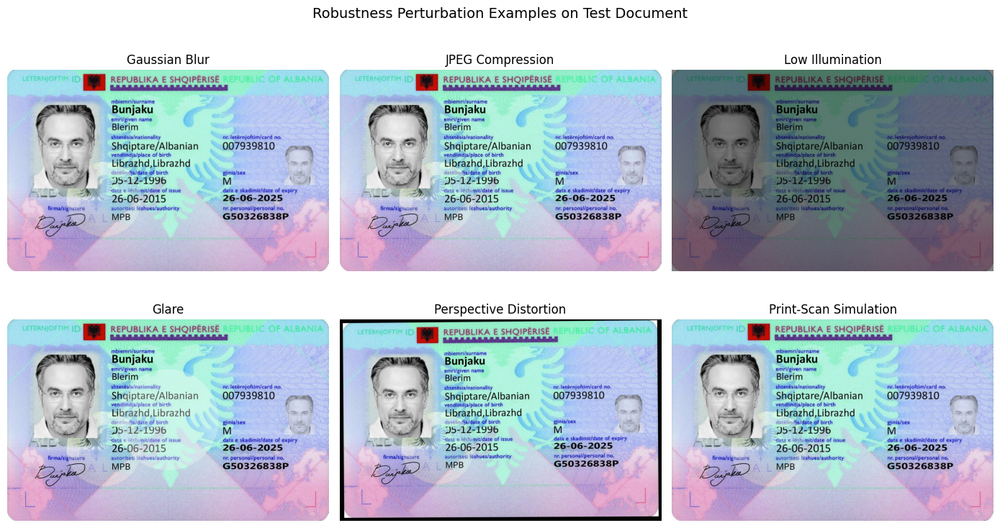

In [56]:
# VISUAL ROBUSTNESS EXAMPLES

# LOAD SAMPLE TEST IMAGE
sample_image_name = df_test.iloc[0]["Image_Name"]

sample_image_path = os.path.join(
    "datasets",
    "testing_set",
    sample_image_name
)

image = cv2.imread(sample_image_path)

# Convert BGR → RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# PLOT DISTORTIONS
fig, axes = plt.subplots(2, 3, figsize=(14, 8))

axes = axes.ravel()

for ax, (name, func) in zip(axes, robustness_transforms.items()):
    transformed = func(image)
    transformed_rgb = cv2.cvtColor(
        transformed,
        cv2.COLOR_BGR2RGB
    )
    ax.imshow(transformed_rgb)
    ax.set_title(name)
    ax.axis("off")

plt.suptitle(
    "Robustness Perturbation Examples on Test Document",
    fontsize=14
)
plt.tight_layout()
plt.show()

In [57]:
# SUCCESSFUL / FAILED DETECTION VISUALIZATION

results_df = df_test.copy()
results_df["True_Label"] = y_test.values
results_df["Predicted_Label"] = test_pred

# TRUE POSITIVES (Successful Forgery Detection)
true_positive = results_df[
    (results_df["True_Label"] == 1) &
    (results_df["Predicted_Label"] == 1)
]

# FALSE NEGATIVES (Missed Forgery)
false_negative = results_df[
    (results_df["True_Label"] == 1) &
    (results_df["Predicted_Label"] == 0)
]

print("Successful detections:", len(true_positive))
print("Failed detections:", len(false_negative))

Successful detections: 36
Failed detections: 3


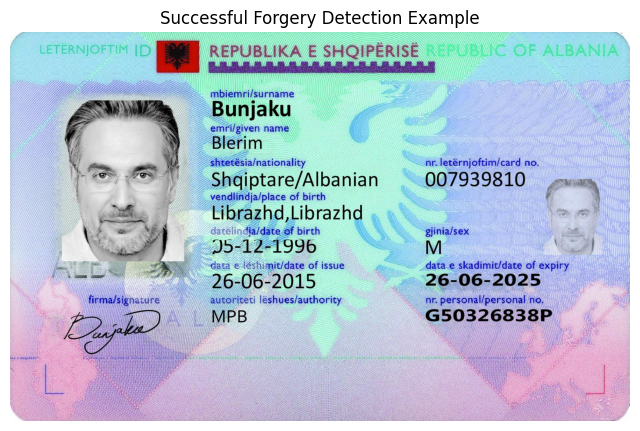

In [58]:
# VISUALIZE SUCCESSFUL DETECTION
sample_name = true_positive.iloc[0]["Image_Name"]

image_path = os.path.join(
    "datasets",
    "testing_set",
    sample_name
)

image = cv2.imread(image_path)

plt.figure(figsize=(8,6))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Successful Forgery Detection Example")
plt.axis("off")
plt.show()

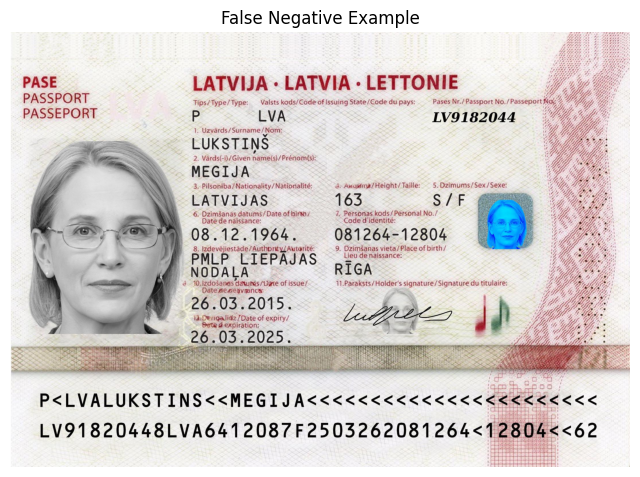

In [59]:
# VISUALIZE FAILURE CASE
if len(false_negative) > 0:

    sample_name = false_negative.iloc[0]["Image_Name"]

    image_path = os.path.join(
        "datasets",
        "testing_set",
        sample_name
    )

    image = cv2.imread(image_path)

    plt.figure(figsize=(8,6))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("False Negative Example")
    plt.axis("off")
    plt.show()

else:
    print("No false negatives found.")

Creating model: ('PP-LCNet_x1_0_doc_ori', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\PP-LCNet_x1_0_doc_ori`.
Creating model: ('UVDoc', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\UVDoc`.
Creating model: ('PP-LCNet_x1_0_textline_ori', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\PP-LCNet_x1_0_textline_ori`.
Creating model: ('PP-OCRv5_server_det', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\user\.paddlex\official_models\PP-OCRv5_server_det`.
Creating model: ('en_PP-OCRv5_mobile_rec', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually:

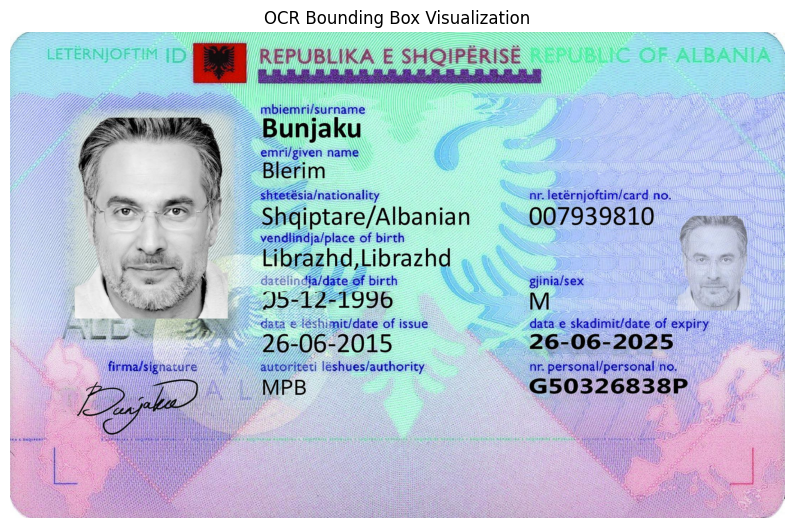

In [60]:
# OCR BOX VISUALIZATION

sample_name = true_positive.iloc[0]["Image_Name"]

image_path = os.path.join(
    "datasets",
    "testing_set",
    sample_name
)

detector = DocumentForgeryDetector(image_path)
detector.preprocess_image()
detector.perform_ocr()
image = detector.original_image.copy()

for box in detector.ocr_boxes:

    x = int(box["x"])
    y = int(box["y"])
    w = int(box["w"])
    h = int(box["h"])

    cv2.rectangle(
        image,
        (x, y),
        (x+w, y+h),
        (0,255,0),
        2
    )

plt.figure(figsize=(10,8))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("OCR Bounding Box Visualization")
plt.axis("off")
plt.show()

Suspicious regions: 10


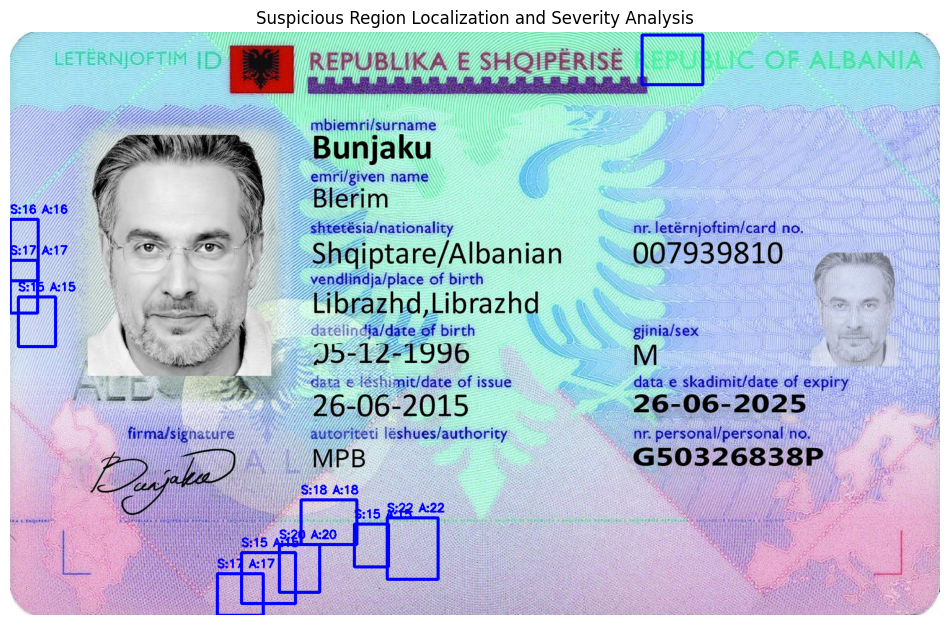

In [61]:
#  SUSPICIOUS REGION VISUALIZATION
sample_name = true_positive.iloc[0]["Image_Name"]

image_path = os.path.join(
    "datasets",
    "testing_set",
    sample_name
)

detector = DocumentForgeryDetector(image_path)
detector.preprocess_image()
detector.detect_text_regions()
detector.segment_characters()
detector.calculate_character_ink_analysis()
detector.calculate_background_stats()
detector.detect_background_anomalies()
detector.calculate_baseline_statistics()
detector.detect_anomalies()
detector.detect_ocr_box_anomalies()
detector.cluster_anomalous_regions()
image = detector.original_image.copy()

top_regions = sorted(
    detector.suspicious_regions,
    key=lambda r: r["severity_proxy"],
    reverse=True
)[:10]

print("Suspicious regions:",
      len(top_regions))

for region in top_regions:
    # EXTRACT REGION DATA
    x1, y1, x2, y2 = region["bbox"]
    severity = region["severity_proxy"]
    anomaly_count = region["anomaly_count"]

    # DRAW BOUNDING BOX
    cv2.rectangle(
        image,
        (x1, y1),
        (x2, y2),
        (255,0,0),
        3
    )

    # LABEL
    label = f"S:{severity} A:{anomaly_count}"
    cv2.putText(
        image,
        label,
        (x1, y1 - 10),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.6,
        (255,0,0),
        2
    )

plt.figure(figsize=(12,10))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title(
    "Suspicious Region Localization and Severity Analysis"
)
plt.axis("off")
plt.show()

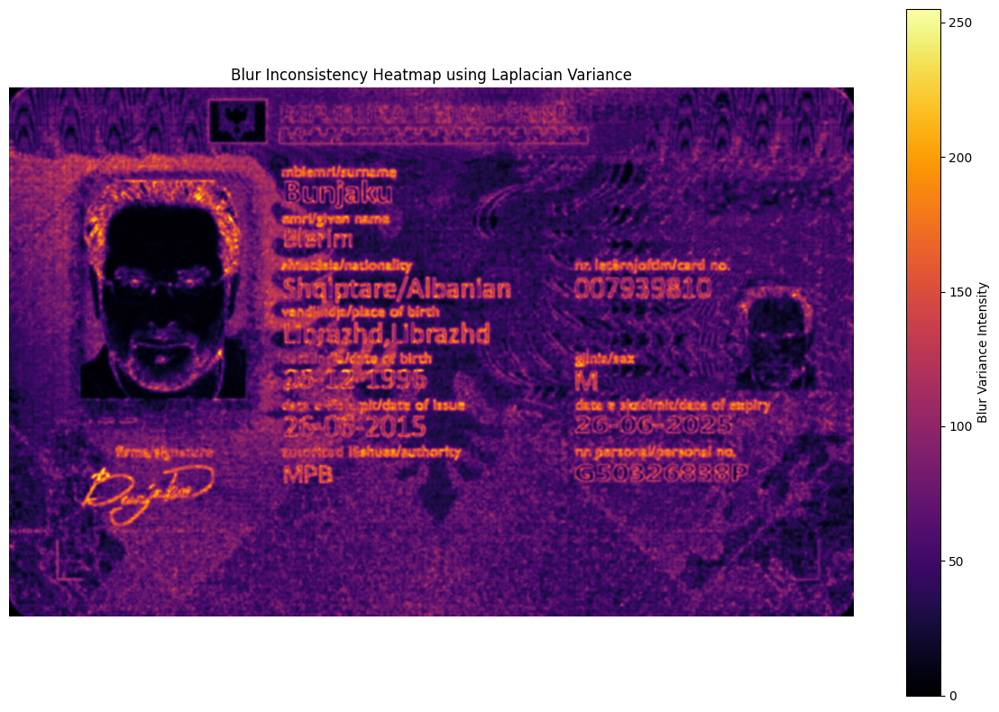

In [62]:
# BLUR HEATMAP VISUALIZATION
sample_name = true_positive.iloc[0]["Image_Name"]

image_path = os.path.join(
    "datasets",
    "testing_set",
    sample_name
)

# LOAD IMAGE
image = cv2.imread(image_path)

gray = cv2.cvtColor(
    image,
    cv2.COLOR_BGR2GRAY
)

# LAPLACIAN RESPONSE
laplacian = cv2.Laplacian(
    gray,
    cv2.CV_64F
)

heatmap = np.absolute(laplacian)

# SMOOTH HEATMAP
heatmap = cv2.GaussianBlur(
    heatmap,
    (15,15),
    0
)

# NORMALIZE
heatmap = cv2.normalize(
    heatmap,
    None,
    0,
    255,
    cv2.NORM_MINMAX
)

heatmap = heatmap.astype(np.uint8)

# DISPLAY
plt.figure(figsize=(12,8))
plt.imshow(
    heatmap,
    cmap="inferno"
)
plt.colorbar(
    label="Blur Variance Intensity"
)
plt.title(
    "Blur Inconsistency Heatmap using Laplacian Variance"
)
plt.axis("off")
plt.tight_layout()

# SAVE FIGURE
plt.savefig(
    "analysis_output/laplacian_heatmap.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

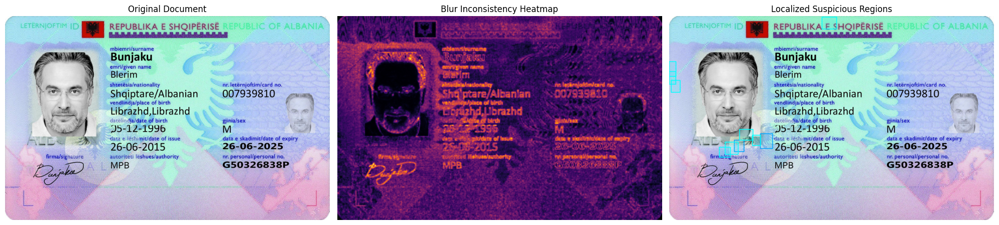

In [63]:
# SIDE-BY-SIDE FORENSIC ANALYSIS
sample_name = true_positive.iloc[0]["Image_Name"]

image_path = os.path.join(
    "datasets",
    "testing_set",
    sample_name
)

# LOAD IMAGE
image = cv2.imread(image_path)

# IMPROVED HEATMAP
gray = cv2.cvtColor(
    image,
    cv2.COLOR_BGR2GRAY
)

laplacian = cv2.Laplacian(
    gray,
    cv2.CV_64F
)

heatmap = np.absolute(laplacian)

# Smooth heatmap
heatmap = cv2.GaussianBlur(
    heatmap,
    (15,15),
    0
)

# Normalize
heatmap = cv2.normalize(
    heatmap,
    None,
    0,
    255,
    cv2.NORM_MINMAX
)

heatmap = heatmap.astype(np.uint8)

# DETECTOR
detector = DocumentForgeryDetector(image_path)
detector.preprocess_image()
detector.detect_text_regions()
detector.segment_characters()
detector.calculate_character_ink_analysis()
detector.calculate_background_stats()
detector.detect_background_anomalies()
detector.calculate_baseline_statistics()
detector.detect_anomalies()
detector.detect_ocr_box_anomalies()
detector.cluster_anomalous_regions()

# OVERLAY IMAGE
overlay = image.copy()

# FILTER TOP REGIONS
filtered_regions = [
    r for r in detector.suspicious_regions
    if (
        r["severity_proxy"] >= 25 and
        r["anomaly_count"] >= 20
    )
]

top_regions = sorted(
    filtered_regions,
    key=lambda r: r["severity_proxy"],
    reverse=True
)[:5]

# DRAW REGIONS
top_regions = sorted(
    detector.suspicious_regions,
    key=lambda r: r["severity_proxy"],
    reverse=True
)[:10]

for region in top_regions:
    x1, y1, x2, y2 = region["bbox"]
    severity = region["severity_proxy"]
    # COLOR CODING
    if severity >= 30:
        color = (255,0,0)
    elif severity >= 20:
        color = (255,165,0)
    else:
        color = (255,255,0)

    # TRANSPARENT OVERLAY
    temp_overlay = overlay.copy()

    cv2.rectangle(
        temp_overlay,
        (x1, y1),
        (x2, y2),
        color,
        -1
    )

    cv2.addWeighted(
        temp_overlay,
        0.15,
        overlay,
        0.85,
        0,
        overlay
    )

    # BOUNDING BOX
    cv2.rectangle(
        overlay,
        (x1, y1),
        (x2, y2),
        color,
        3
    )

# DISPLAY
fig, axes = plt.subplots(
    1,
    3,
    figsize=(20,7)
)

# ORIGINAL
axes[0].imshow(
    cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )
)

axes[0].set_title(
    "Original Document"
)

axes[0].axis("off")

# HEATMAP
axes[1].imshow(
    heatmap,
    cmap="inferno"
)

axes[1].set_title(
    "Blur Inconsistency Heatmap"
)

axes[1].axis("off")

# SUSPICIOUS REGIONS
overlay_rgb = cv2.cvtColor(
    overlay,
    cv2.COLOR_BGR2RGB
)

axes[2].imshow(overlay_rgb)

axes[2].set_title(
    "Localized Suspicious Regions"
)

axes[2].axis("off")

plt.tight_layout()

# SAVE FIGURE
plt.savefig(
    "analysis_output/side_by_side_forensic_analysis.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

### Failure Analysis

False Negatives: 3
False Positives: 7


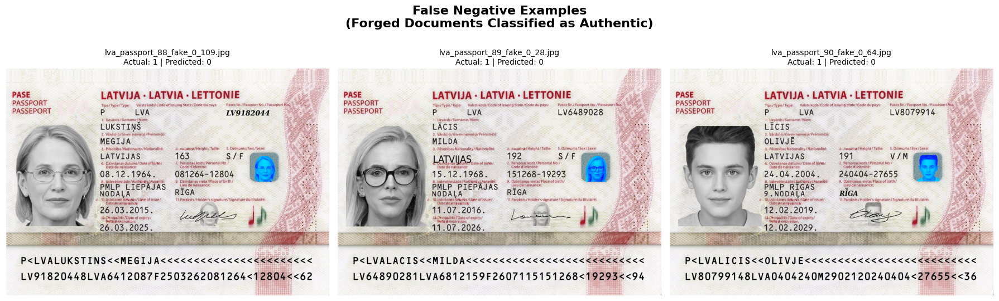

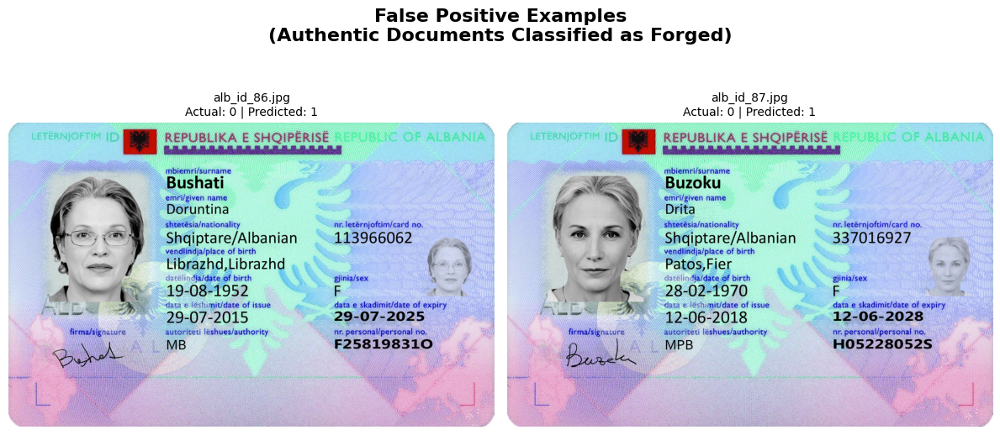

In [64]:
# FAILURE ANALYSIS WITH IMAGE VISUALIZATION

# BUILD RESULTS DATAFRAME
results_df = pd.DataFrame({
    "Image_Name": test_df["Image_Name"],
    "Actual": y_test.values,
    "Predicted": y_pred

})

# FALSE NEGATIVES
# Actual Forged → Predicted Authentic

false_negatives = results_df[
    (results_df["Actual"] == 1) &
    (results_df["Predicted"] == 0)
]

# FALSE POSITIVES
# Actual Authentic → Predicted Forged 
false_positives = results_df[
    (results_df["Actual"] == 0) &
    (results_df["Predicted"] == 1)
]

# DISPLAY COUNTS
print(
    "False Negatives:",
    len(false_negatives)
)

print(
    "False Positives:",
    len(false_positives)
)

# FUNCTION TO DISPLAY IMAGES

def display_failure_examples(
    dataframe,
    title,
    max_images=3
):

    if len(dataframe) == 0:
        print(f"No samples found for {title}")
        return

    # LIMIT NUMBER OF IMAGES
    dataframe = dataframe.head(max_images)
    fig, axes = plt.subplots(
        1,
        len(dataframe),
        figsize=(6 * len(dataframe), 6)
    )

    # Fix single-image case
    if len(dataframe) == 1:
        axes = [axes]

    # LOOP THROUGH IMAGES
    for ax, (_, row) in zip(axes, dataframe.iterrows()):
        image_name = row["Image_Name"]
        image_path = os.path.join(
            "datasets",
            "testing_set",
            image_name
        )

        image = cv2.imread(image_path)

        if image is None:
            ax.set_title(
                "Image Not Found"
            )
            ax.axis("off")
            continue

        image_rgb = cv2.cvtColor(
            image,
            cv2.COLOR_BGR2RGB
        )

        # SHOW IMAGE
        ax.imshow(image_rgb)
        ax.set_title(
            f"{image_name}\n"
            f"Actual: {row['Actual']} | "
            f"Predicted: {row['Predicted']}",
            fontsize=10
        )

        ax.axis("off")

    # MAIN TITLE

    plt.suptitle(
        title,
        fontsize=16,
        weight="bold"
    )
    plt.tight_layout()
    plt.show()

# DISPLAY FALSE NEGATIVES

display_failure_examples(
    false_negatives,
    "False Negative Examples\n"
    "(Forged Documents Classified as Authentic)",
    max_images=3
)

# DISPLAY FALSE POSITIVES

display_failure_examples(
    false_positives,
    "False Positive Examples\n"
    "(Authentic Documents Classified as Forged)",
    max_images=2
)

In [65]:
# FAILURE TYPE ANALYSIS TABLE

failure_analysis_rows = []

for failure_type in robustness_detail_df[
    "Failure_Type"
].unique():

    subset = robustness_detail_df[
        robustness_detail_df["Failure_Type"]
        ==
        failure_type
    ]

    fn_count = len(

        subset[
            (subset["Actual"] == 1)
            &
            (subset["Predicted"] == 0)
        ]

    )

    fp_count = len(

        subset[
            (subset["Actual"] == 0)
            &
            (subset["Predicted"] == 1)
        ]

    )

    failure_analysis_rows.append({

        "Failure Type":
            failure_type,

        "False Negative (%)":
            round(
                100 * fn_count / len(subset),
                2
            ),

        "False Positive (%)":
            round(
                100 * fp_count / len(subset),
                2
            )

    })

failure_type_df = pd.DataFrame(
    failure_analysis_rows
)

display(
    failure_type_df
)

,Failure Type,False Negative (%),False Positive (%)
0,Gaussian Blur,60.0,20.0
1,JPEG Compression,0.0,20.0
2,Low Illumination,20.0,20.0
3,Glare,20.0,20.0
4,Perspective Distortion,60.0,0.0
5,Print-Scan Simulation,20.0,20.0



Borderline Cases:


,Image_Name,Actual,Predicted,Forgery_Probability,Distance
29,lva_passport_90_fake_0_64.jpg,1,0,0.48,0.02
19,alb_id_92.jpg,0,0,0.48,0.02
38,lva_passport_94.jpg,0,0,0.48,0.02


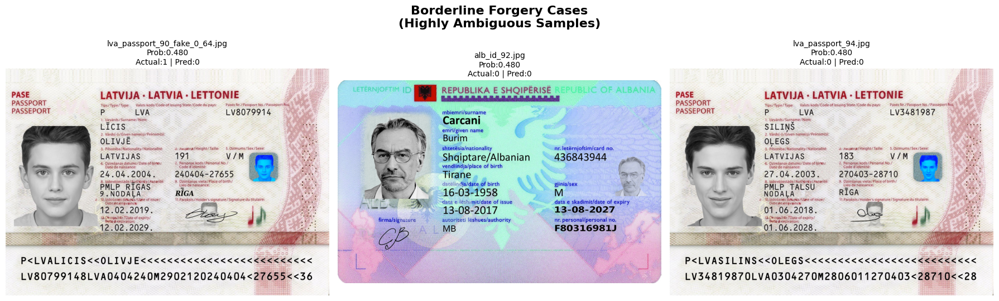

In [66]:
# BORDERLINE / DIFFICULT CASE VISUALIZATION

# PREDICTION PROBABILITIES

probs = rf_pipeline.predict_proba(
    X_test
)[:, 1]

#  BUILD PROBABILITY DATAFRAME

borderline_df = pd.DataFrame({
    "Image_Name": test_df["Image_Name"],
    "Actual": y_test.values,
    "Predicted": y_pred,
    "Forgery_Probability": probs
})

# BORDERLINE CASES
# CLOSE TO 0.5 THRESHOLD
borderline_df["Distance"] = np.abs(
    borderline_df["Forgery_Probability"] - 0.5
)

borderline_cases = borderline_df.sort_values(
    by="Distance"
).head(3)

print("\nBorderline Cases:")
display(borderline_cases)

# DISPLAY BORDERLINE IMAGES
fig, axes = plt.subplots(
    1,
    len(borderline_cases),
    figsize=(18,6)
)

if len(borderline_cases) == 1:
    axes = [axes]

for ax, (_, row) in zip(
    axes,
    borderline_cases.iterrows()
):
    image_name = row["Image_Name"]
    image_path = os.path.join(
        "datasets",
        "testing_set",
        image_name
    )

    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )
    ax.imshow(image_rgb)
    ax.set_title(
        f"{image_name}\n"
        f"Prob:{row['Forgery_Probability']:.3f}\n"
        f"Actual:{row['Actual']} | "
        f"Pred:{row['Predicted']}",
        fontsize=10
    )

    ax.axis("off")

plt.suptitle(
    "Borderline Forgery Cases\n"
    "(Highly Ambiguous Samples)",
    fontsize=16,
    weight="bold"
)

plt.tight_layout()
plt.show()

### Comparison with other CNN Models

In [67]:
#  LIGHTWEIGHT CNN BASELINES 
import torch 
import torch.nn as nn 
from torchvision import models 

baseline_models = { "ResNet18": models.resnet18(weights=None),
                    "EfficientNetB0": models.efficientnet_b0(weights=None),
                      "MobileNetV3": models.mobilenet_v3_small(weights=None) 
                      } 

comparison_rows = [] 
for model_name, dl_model in baseline_models.items(): 
  total_params = sum(p.numel() for p in dl_model.parameters()) 
  comparison_rows.append({ "Method": model_name, "Parameters": total_params, "GPU Needed": "Recommended", "Inference Type": "Deep Learning" }) 
comparison_rows.append({ "Method": "Proposed Random Forest", "Parameters": 50, "GPU Needed": "No", "Inference Type": "Handcrafted + ML" }) 

comparison_df = pd.DataFrame(comparison_rows) 
comparison_df

,Method,Parameters,GPU Needed,Inference Type
0,ResNet18,11689512,Recommended,Deep Learning
1,EfficientNetB0,5288548,Recommended,Deep Learning
2,MobileNetV3,2542856,Recommended,Deep Learning
3,Proposed Random Forest,50,No,Handcrafted + ML


In [68]:
device = torch.device("cpu")

print("Using device:", device)

Using device: cpu


In [69]:
# IMAGE DATASET

class ForgeryDataset(Dataset):

    def __init__(self, dataframe, image_dir, transform=None):

        self.df = dataframe
        self.image_dir = image_dir
        self.transform = transform

    def __len__(self):

        return len(self.df)

    def __getitem__(self, idx):

        row = self.df.iloc[idx]

        image_name = row["Image_Name"]

        label = int(row["Label"])

        image_path = os.path.join(
            self.image_dir,
            image_name
        )

        image = Image.open(image_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        return image, label

In [70]:
# TRANSFORMS
transform = transforms.Compose([

    transforms.Resize((224,224)),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[0.485,0.456,0.406],
        std=[0.229,0.224,0.225]
    )
])

In [71]:
# DATA DIRECTORIES
train_image_dir = "datasets/training_set"

test_image_dir = "datasets/testing_set"

# DATASETS
train_dataset = ForgeryDataset(
    df_train_raw,
    image_dir=train_image_dir,
    transform=transform
)

test_dataset = ForgeryDataset(
    df_test,
    image_dir=test_image_dir,
    transform=transform
)

# DATA LOADERS

train_loader = DataLoader(
    train_dataset,
    batch_size=8,
    shuffle=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=8,
    shuffle=False
)

In [72]:
# TRAIN FUNCTION

def train_model(model, epochs=3):

    criterion = nn.CrossEntropyLoss()

    optimizer = optim.Adam(
        model.parameters(),
        lr=0.0001
    )

    model.to(device)

    model.train()

    for epoch in range(epochs):

        running_loss = 0

        for images, labels in train_loader:

            images = images.to(device)

            labels = labels.to(device)

            optimizer.zero_grad()

            outputs = model(images)

            loss = criterion(outputs, labels)

            loss.backward()

            optimizer.step()

            running_loss += loss.item()

        print(
            f"Epoch {epoch+1}/{epochs} "
            f"Loss: {running_loss:.4f}"
        )

    return model

In [73]:
# EVALUATION FUNCTION
def evaluate_model(model):

    model.eval()

    preds = []

    truths = []

    with torch.no_grad():

        for images, labels in test_loader:

            images = images.to(device)

            outputs = model(images)

            predicted = torch.argmax(
                outputs,
                dim=1
            )

            preds.extend(
                predicted.cpu().numpy()
            )

            truths.extend(
                labels.numpy()
            )

    accuracy = accuracy_score(
        truths,
        preds
    )

    recall = recall_score(
        truths,
        preds
    )

    precision = precision_score(
        truths,
        preds
    )

    f1 = f1_score(
        truths,
        preds
    )

    return {
        "Accuracy": accuracy,
        "Recall": recall,
        "Precision": precision,
        "F1-Score": f1
    }

In [74]:
# CNN BASELINES
baseline_models = {

    "ResNet18":
        models.resnet18(weights="DEFAULT"),

    "EfficientNetB0":
        models.efficientnet_b0(weights="DEFAULT"),

    "MobileNetV3":
        models.mobilenet_v3_small(weights="DEFAULT"),
}

In [75]:
# TRAIN + EVALUATE

cnn_results = []

for model_name, model in baseline_models.items():

    print("\n==============================")
    print("Training:", model_name)
    print("==============================")

    # FINAL CLASSIFIER
    if model_name == "ResNet18":

        model.fc = nn.Linear(
            model.fc.in_features,
            2
        )

    else:

        model.classifier[-1] = nn.Linear(
            model.classifier[-1].in_features,
            2
        )

    # TRAINING TIME

    start = time.time()

    trained_model = train_model(
        model,
        epochs=3
    )

    training_time = (
        time.time() - start
    )

    # MODEL SIZE (MEMORY)

    model_path = (
        f"{model_name}.pth"
    )

    torch.save(
        trained_model.state_dict(),
        model_path
    )

    memory_mb = (
        os.path.getsize(model_path)
        / 1024
        / 1024
    )

    # EVALUATION METRICS

    metrics = evaluate_model(
        trained_model
    )

    # INFERENCE TIME

    trained_model.eval()

    start = time.time()

    with torch.no_grad():

        total_images = 0

        for images, labels in test_loader:

            images = images.to(device)

            _ = trained_model(images)

            total_images += len(images)

    total_inference_time = (
        time.time() - start
    )

    inference_time_ms = (

        total_inference_time
        / total_images

    ) * 1000

    # PARAMETER COUNT

    total_params = sum(

        p.numel()

        for p in trained_model.parameters()

    )

    # STORE RESULTS

    cnn_results.append({

        "Method":
            model_name,

        "Training Time (s)":
            round(
                training_time,
                2
            ),

        "Inference Time (ms/image)":
            round(
                inference_time_ms,
                4
            ),

        "Memory (MB)":
            round(
                memory_mb,
                2
            ),

        "Parameters":
            f"{total_params:,}",

        "Accuracy (%)":
            round(
                metrics["Accuracy"] * 100,
                2
            ),

        "Recall (%)":
            round(
                metrics["Recall"] * 100,
                2
            ),

        "Precision (%)":
            round(
                metrics["Precision"] * 100,
                2
            ),

        "F1-Score (%)":
            round(
                metrics["F1-Score"] * 100,
                2
            ),

        "GPU Needed":
            "Recommended",

        "Interpretability":
            "Low"

    })



Training: ResNet18
Epoch 1/3 Loss: 33.4086
Epoch 2/3 Loss: 26.9822
Epoch 3/3 Loss: 25.0901

Training: EfficientNetB0
Epoch 1/3 Loss: 29.5217
Epoch 2/3 Loss: 26.6592
Epoch 3/3 Loss: 24.8612

Training: MobileNetV3
Epoch 1/3 Loss: 29.4576
Epoch 2/3 Loss: 28.0677
Epoch 3/3 Loss: 27.5049


In [76]:
# RANDOM FOREST RESULT
cnn_results.append({

    "Method":
        "Proposed Random Forest",

    "Training Time (s)":
        round(rf_training_time, 2),

    "Inference Time (ms/image)":
        round(rf_inference_time, 4) * 1000,

    "Memory (MB)":
        round(rf_memory_mb, 2),

    "Parameters":
        50,

    "Accuracy (%)":
        round(testing_metrics["accuracy"] * 100, 2),

    "Recall (%)":
        round(testing_metrics["recall"] * 100, 2),

    "Precision (%)":
        round(testing_metrics["precision"] * 100, 2),

    "F1-Score (%)":
        round(testing_metrics["f1_score"] * 100, 2),

    "GPU Needed":
        "No",

    "Interpretability":
        "High"

})

In [77]:
# FINAL COMPARISON TABLE

cnn_results_df = pd.DataFrame(
    cnn_results
)

display(
    cnn_results_df
)

,Method,Training Time (s),Inference Time (ms/image),Memory (MB),Parameters,Accuracy (%),Recall (%),Precision (%),F1-Score (%),GPU Needed,Interpretability
0,ResNet18,181.62,102.4162,42.71,"11,177,538",53.03,51.28,62.50,56.34,Recommended,Low
1,EfficientNetB0,210.64,98.6454,15.58,"4,010,110",66.67,64.10,75.76,69.44,Recommended,Low
2,MobileNetV3,97.15,68.4881,5.92,"1,519,906",59.09,100.00,59.09,74.29,Recommended,Low
3,Proposed Random Forest,0.22,0.3000,0.36,50,84.85,92.31,83.72,87.80,No,High


In [78]:
# VISION TRANSFORMER (ViT-B/16) BASELINE

from torchvision import models

vit_model = models.vit_b_16(
weights=None
)

# Replace classification head

vit_model.heads.head = nn.Linear(
vit_model.heads.head.in_features,
2
)

vit_model = vit_model.to(device)

criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(
vit_model.parameters(),
lr=1e-4
)

num_epochs = 10

for epoch in range(num_epochs):

  vit_model.train()

  running_loss = 0

  for images, labels in train_loader:

      images = images.to(device)
      labels = labels.to(device)

      optimizer.zero_grad()

      outputs = vit_model(images)

      loss = criterion(
          outputs,
          labels
      )

      loss.backward()

      optimizer.step()

      running_loss += loss.item()

  print(
      f"Epoch {epoch+1}/{num_epochs}"
      f" Loss={running_loss:.4f}"
  )


# TEST EVALUATION

vit_model.eval()

all_preds = []
all_labels = []

with torch.no_grad():

  for images, labels in test_loader:

      images = images.to(device)

      outputs = vit_model(images)

      preds = torch.argmax(
          outputs,
          dim=1
      )

      all_preds.extend(
          preds.cpu().numpy()
      )

      all_labels.extend(
          labels.numpy()
      )

vit_accuracy = accuracy_score(
all_labels,
all_preds
)

vit_recall = recall_score(
all_labels,
all_preds
)

vit_precision = precision_score(
all_labels,
all_preds
)

vit_f1 = f1_score(
all_labels,
all_preds
)



Epoch 1/10 Loss=38.2661
Epoch 2/10 Loss=28.6439
Epoch 3/10 Loss=30.9861
Epoch 4/10 Loss=29.8518
Epoch 5/10 Loss=29.1354
Epoch 6/10 Loss=29.5041
Epoch 7/10 Loss=31.4151
Epoch 8/10 Loss=29.6240
Epoch 9/10 Loss=28.3518
Epoch 10/10 Loss=29.7507


In [79]:
# PROPOSED METHOD VS VIT-B/16

vit_comparison_df = pd.DataFrame([

    {

        "Method":
            "Proposed Random Forest",

        "Accuracy (%)":
            round(
                testing_metrics["accuracy"] * 100,
                2
            ),

        "Recall (%)":
            round(
                testing_metrics["recall"] * 100,
                2
            ),

        "Precision (%)":
            round(
                testing_metrics["precision"] * 100,
                2
            ),

        "F1-Score (%)":
            round(
                testing_metrics["f1_score"] * 100,
                2
            ),

        "GPU Needed":
            "No",

        "Interpretability":
            "High"

    },

    {

        "Method":
            "ViT-B/16",

        "Accuracy (%)":
            round(
                vit_accuracy * 100,
                2
            ),

        "Recall (%)":
            round(
                vit_recall * 100,
                2
            ),

        "Precision (%)":
            round(
                vit_precision * 100,
                2
            ),

        "F1-Score (%)":
            round(
                vit_f1 * 100,
                2
            ),

        "GPU Needed":
            "Yes",

        "Interpretability":
            "Low"

    }

])

display(vit_comparison_df)

,Method,Accuracy (%),Recall (%),Precision (%),F1-Score (%),GPU Needed,Interpretability
0,Proposed Random Forest,84.85,92.31,83.72,87.80,No,High
1,ViT-B/16,59.09,100.00,59.09,74.29,Yes,Low


In [80]:
# PADDLEOCR + RANDOM FOREST BASELINE

# OCR-ONLY FEATURES

ocr_columns = [

    "Char_Count",
    "Field_Detected_Count",
    "Field_Completeness_Ratio",
    "OCR_Quality",
    "Field_Completeness",
    "Num_OCR_Box_Anomalies",
    "Has_POB"

]

# Keep only existing columns
ocr_columns = [
    col
    for col in ocr_columns
    if col in X_train.columns
]

print(
    "OCR Features Used:",
    ocr_columns
)

# BUILD DATASETS

X_train_ocr = X_train[
    ocr_columns
].copy()

X_test_ocr = X_test[
    ocr_columns
].copy()

# Missing values
X_train_ocr = X_train_ocr.fillna(0)
X_test_ocr = X_test_ocr.fillna(0)

# TRAIN OCR BASELINE

rf_ocr = RandomForestClassifier(
    n_estimators=50,
    random_state=42,
    class_weight="balanced"
)

rf_ocr.fit(
    X_train_ocr,
    y_train
)

# PREDICTIONS

ocr_preds = rf_ocr.predict(
    X_test_ocr
)

# METRICS

ocr_accuracy = accuracy_score(
    y_test,
    ocr_preds

)

ocr_recall = recall_score(
    y_test,
    ocr_preds

)

ocr_precision = precision_score(
    y_test,
    ocr_preds
)

ocr_f1 = f1_score(
    y_test,
    ocr_preds
)

# RESULTS TABLE

ocr_baseline_df = pd.DataFrame([
    {
        "Method":
            "PaddleOCR + RF Baseline",

        "Accuracy (%)":
            round(
                ocr_accuracy * 100,
                2
            ),

        "Recall (%)":
            round(
                ocr_recall * 100,
                2
            ),

        "Precision (%)":
            round(
                ocr_precision * 100,
                2
            ),

        "F1-Score (%)":
            round(
                ocr_f1 * 100,
                2
            )
    },

    {
        "Method":
            "Proposed Framework",

        "Accuracy (%)":
            round(
                testing_metrics["accuracy"] * 100,
                2
            ),

        "Recall (%)":
            round(
                testing_metrics["recall"] * 100,
                2
            ),

        "Precision (%)":
            round(
                testing_metrics["precision"] * 100,
                2
            ),

        "F1-Score (%)":
            round(
                testing_metrics["f1_score"] * 100,
                2
            )
    }

])

display(
    ocr_baseline_df
)

OCR Features Used: ['Char_Count', 'Field_Detected_Count', 'Field_Completeness_Ratio', 'OCR_Quality', 'Field_Completeness', 'Num_OCR_Box_Anomalies', 'Has_POB']


,Method,Accuracy (%),Recall (%),Precision (%),F1-Score (%)
0,PaddleOCR + RF Baseline,51.52,48.72,61.29,54.29
1,Proposed Framework,84.85,92.31,83.72,87.80
